<a href="https://colab.research.google.com/github/DerivedFunction01/mdc-ubuntu/blob/main/movie_reviews.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## This notebook requires a Tesla T4 Runtime environment

# 1. Executive Summary

This project addresses the task of sentiment analysis on movie reviews, aiming to classify reviews as either 'positive' or 'negative'. The IMDB Dataset, comprising 50,000 movie reviews, served as the primary data source, undergoing standard preprocessing steps including train-test splitting and TF-IDF vectorization for traditional models, and tokenization for the Large Language Model (LLM).

Two main approaches were evaluated:

1. **Traditional Machine Learning Models**: Multinomial Naive Bayes, Logistic Regression, SGD Classifier, and Linear Support Vector Classifier (SVC).

2. **Neural Networks**: LSTM and CNN.

3. **Large Language Model (LLM)**: A fine-tuned DistilBERT and RoBERTa model.


## Key Findings:

*    The LLMs emerged as the top performers, achieving over 91% in accuracy, precision, recall, and F1-score. This represents a modest but consistent improvement of around 1.5-5.0% over the best traditional model. Larger LLMs (RoBERTa base) have a slight improvements over smaller models (DistilBERT)

*    Among traditional models, Logistic Regression and SGD showed the strongest performance, with metrics at around 90%. This is metric is roughly identical even with less text cleaning (compared to the 2nd solution).

*    Among neural networks, while it took longer to train and evaluate compared to traditional models, but took less time and resources compared to LLMs, its performance to cost is not competitive vs traditional models.

*    A significant trade-off was observed in computational resources. The **LLM required substantially more training and prediction time** (5x to 80x slower) compared to traditional ML models for a minor gain in performance metrics.


## Conclusion:

The business insights derived from this dataset suggest that, when evaluating sentiment at scale for a single movie, all models, regardless of complexity, produce reliably consistent results (> 80% accuracy). This means that for high-level business decisions, lightweight traditional models provide sufficiently accurate and actionable insights.

While the LLM provides a slight edge in predictive accuracy, its higher computational cost (both in training and inference) necessitates careful consideration. Traditional models like Logistic Regression offer a more balanced solution for scenarios prioritizing speed and efficiency with only a marginal compromise in accuracy. The LLM is best suited for applications where maximizing every percentage point of accuracy is critical, and the increased computational overhead is acceptable.

# 2. Evaluation of Existing Solutions
---
## [NLP with XLM-RoBERTA](https://www.kaggle.com/code/dibadev09/imdb-sentiment-analysis-using-xlm-roberta)

### Introduction to RoBERTA

The utilization of XLM-RoBERTa (XLM-R) for sentiment analysis on the IMDB dataset marks a significant departure from monolingual pre-trained models. XLM-RoBERTa is a multi-lingual adaptation of the Robustly Optimized BERT Pretraining Approach (RoBERTa), specifically designed to leverage the benefits of cross-lingual pre-training without sacrificing performance on English-centric tasks.

The modeling approach within the XLM-RoBERTa solution relies on the transformer's self-attention mechanism, which allows the model to process input sequences in parallel while maintaining a global context of the word-to-word relationships. Unlike traditional models that process text in a linear or sequential fashion, XLM-R utilizes a bidirectional encoder that views the entire review simultaneously. This is particularly critical for movie reviews, where the sentiment is often determined by long-range dependencies: for instance, a review might start with positive descriptions of cinematography only to conclude with a negative verdict on the plot.

Finally, transformer models benefit from differing variants of a root word, as it automatically learns rich embeddings. For example, while "run" and "running" may be considered differing words under a traditional model, transformer models are able to understand that both terms are similar. Likewise, while "The" and "the" may be two distinct tokens, it should also understand that both terms are similar as well.

The empirical results for the XLM-RoBERTa solution demonstrate the high ceiling of transformer models for binary classification. The model achieves an evaluation accuracy of 93.94% on the IMDB test set. This performance is consistent with our own findings, where fine-tuned RoBERTa-base variants typically achieve accuracies above 90%.


### Gaps and Structural Shortfalls of using LLMs
While the XLM-RoBERTa solution provides state-of-the-art accuracy, several critical gaps and shortfalls are evident upon closer examination.

The most significant shortfall is the extreme computational requirement of the architecture. Fine-tuning a transformer model with approximately 300 million parameters requires significant GPU memory and training time. For many real-time applications or resource-constrained environments, the latency associated with transformer inference may be prohibitive. Furthermore, the reliance on a 2-epoch training cycle, while effective for reaching high accuracy, carries a high carbon footprint and energy cost compared to statistical models that train in seconds. Finally, much cheaper distilled variants such as DistilBERT are much smaller in size, yet have similar performance compared to the base model.

#### Notebook shortfalls
1. The lack of text normalization: While transformer models are able to handle varying text, noise artifacts such as HTML tags should be removed.

---
## [NLP with LogReg, RandomForest, Decision Tree](https://www.kaggle.com/code/tarkkaanko/imdb-movie-review-sentiment-analysis/notebook)


The second solution under review adopts a dramatically different philosophy, utilizing a suite of traditional machine learning algorithms: Logistic Regression (LogReg), Random Forest (RF), and Decision Trees (DT). This methodology prioritizes transparency, computational efficiency, and the efficacy of manual feature engineering over the autonomous feature extraction seen in neural architectures.   

### Preprocessing and Feature Extraction Strategies
The modeling approach for these traditional algorithms is deeply intertwined with the quality of text preprocessing. The implementation details for this solution follow a rigorous text-cleaning pipeline to convert raw HTML movie reviews into structured numerical representations. Unlike transformer models, each word is distinct unless normalized to a root word.

1. HTML and Noise Removal: The removal of HTML tags (using regular expressions like <.*?>) and special characters is essential, as the IMDB dataset is frequently scraped from web sources and contains artifacts that can skew word frequency distributions.   

2. Normalization: Text is converted to lowercase to ensure that "Great" and "great" are treated as the same feature.   

3. Tokenization and Stop Word Elimination: The reviews are segmented into individual tokens, and common words (e.g., "and," "the," "a") are removed to focus on sentiment-bearing terms.   

4. Lemmatization: Words are reduced to their root forms (e.g., "running" to "run"), which helps in consolidating the vocabulary and reducing the dimensionality of the feature space.


### Comparative Performance Analysis of Traditional ML Models
The results for this solution reveal a clear hierarchy of performance among the three selected classifiers. Logistic Regression emerges as the most effective, followed by Random Forest, with Decision Trees lagging significantly behind.

Logistic Regression demonstrates remarkable effectiveness, achieving nearly 89% accuracy. Its success is attributed to its ability to handle sparse, high-dimensional feature spaces where the number of features (vocabulary size) often exceeds the number of samples. In contrast, Decision Trees suffer from overfitting and struggle with the axis-aligned splits in the high-dimensional TF-IDF space, leading to suboptimal generalization. Random Forest improves upon the single decision tree by aggregating the results of multiple trees, reaching an accuracy of 85-86%, yet it remains less efficient and less accurate than the linear model for this specific textual task.   

### Feedback on Gaps and Methodological Shortfalls
The traditional ML solution possesses several significant shortfalls that limit its utility in modern high-precision sentiment analysis.

The primary gap is the "contextual blindness" inherent in Bag-of-Words and TF-IDF representations. These methods treat words as independent features, discarding the relative order of words and the syntactic structure of the sentence. Consequently, these models often fail to identify negation (e.g., "not good") or sarcasm, where the sentiment is the opposite of the literal word meanings. For instance, a review stating, "If you want to be bored for two hours, this is the perfect movie," would likely be classified as positive by a TF-IDF-based model because of the presence of the word "perfect". Finally, text
cleaning is essential but will not cover all scenarios, such as mispellings.

A second shortfall is the high sensitivity to feature engineering. The performance of these models is heavily dependent on the choice of n-grams (unigrams vs. bigrams), the maximum number of features, and the specific stop word list used. Unlike the XLM-RoBERTa solution, which automatically learns rich embeddings, the traditional ML solution requires the researcher to manually tune the feature extraction parameters, which may not generalize well to different datasets or languages.   

Finally, while Logistic Regression is extremely fast, its "ceiling" of approximately 89-90% accuracy represents a hard limit for statistical linear models on this dataset.

In [ ]:
import re
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import time
import math
from enum import Enum
from typing import Callable, List, Optional
from collections import defaultdict, Counter


from sklearn.feature_extraction.text import CountVectorizer, ENGLISH_STOP_WORDS
from sklearn.metrics import (precision_score, recall_score, f1_score,
                             accuracy_score, balanced_accuracy_score,
                             classification_report, confusion_matrix)

from sklearn.model_selection import train_test_split


import kagglehub
from pathlib import Path
# Download latest version
path = Path(kagglehub.dataset_download("lakshmi25npathi/imdb-dataset-of-50k-movie-reviews")) / "IMDB Dataset.csv"

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'imdb-dataset-of-50k-movie-reviews' dataset.
Path to dataset files: /kaggle/input/imdb-dataset-of-50k-movie-reviews/IMDB Dataset.csv


# 3. Data Description and Preprocessing

### Data Loading and Initial Inspection

The dataset, `IMDB Dataset.csv`, containing 50,000 movie reviews and their sentiment labels (positive/negative), was loaded into a pandas DataFrame. Initial inspection using `describe()` and `keys()` revealed the structure and basic statistics of the data.

One initial preprocessing step includes stripping out HTML artifacts and non alpha-numeric characters.

Another advanced version attempts to solve the negation issue by grouping

In [ ]:
trad_metrics_df = pd.DataFrame()
trad_time_df = pd.DataFrame()
nn_metrics_df = pd.DataFrame()
nn_time_df = pd.DataFrame()
transformer_metrics_df = pd.DataFrame()
transformer_time_df = pd.DataFrame()

# Global lists to store confusion matrix plotters for each model type
trad_cm_plotters = []
nn_cm_plotters = []
transformer_cm_plotters = []

def plot_model_metrics(
    df,
    title,
    y_label="Score",
    x_label="Model",
    palette="viridis",
    ylim=None,
    fmt="%.3f",
    figsize=(20, 10)
):
    """
    Generic helper function to plot grouped bar charts for model metrics.
    Works for both performance metrics and time metrics.

    Parameters:
        df (pd.DataFrame): Must contain ['Model', 'Metric', 'Score']
        title (str): Plot title
        y_label (str): Label for y-axis
        x_label (str): Label for x-axis
        palette (str): Seaborn palette
        ylim (tuple): Optional y-axis limits (min, max)
        fmt (str): Format string for bar labels
        figsize (tuple): Figure size
    """

    plt.figure(figsize=figsize)
    ax = sns.barplot(
        x='Model',
        y='Score',
        hue='Metric',
        data=df,
        palette=palette
    )

    plt.title(title)
    plt.ylabel(y_label)
    plt.xlabel(x_label)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    if ylim:
        plt.ylim(*ylim)

    # Add labels on bars
    for container in ax.containers:
        ax.bar_label(container, fmt=fmt, label_type='edge', fontsize=8, padding=3)

    plt.legend(title='Metric')
    plt.show()
def plot_grid(
    plot_functions: List[Callable[[plt.Axes], None]],
    n_cols: int = 4,
    figsize_per_plot: tuple = (5, 4.5),
    suptitle: Optional[str] = None,
    sharex: bool = True,
    sharey: bool = True,
    hide_empty_axes: bool = True
):
    """
    Create a figure with multiple plots arranged in a grid.

    Parameters
    ----------
    plot_functions : list of callables
        Each function should take an Axes object and plot on it
        (does NOT call plt.show() or plt.figure() inside)
    n_cols : int, default 4
        Number of columns in the grid
    figsize_per_plot : tuple, default (5, 4.5)
        Approximate size per subplot
    suptitle : str or None
        Overall figure title
    sharex/sharey : bool
        Whether subplots should share x/y axes
    hide_empty_axes : bool
        Hide axes that have no plot assigned
    """
    n_plots = len(plot_functions)
    if n_plots == 0:
        return

    n_rows = math.ceil(n_plots / n_cols)

    fig, axes = plt.subplots(
        nrows=n_rows,
        ncols=n_cols,
        figsize=(figsize_per_plot[0] * n_cols, figsize_per_plot[1] * n_rows),
        sharex=sharex,
        sharey=sharey,
        constrained_layout=True
    )

    # Make axes iterable even for 1-row or 1-col cases
    axes = axes.flat if n_rows > 1 or n_cols > 1 else [axes]

    for ax, plot_fn in zip(axes, plot_functions):
        plot_fn(ax)  # <- this is where the actual plotting happens

    # Hide unused subplots
    if hide_empty_axes:
        for ax in axes[n_plots:]:
            ax.set_visible(False)
            ax.set_axis_off()

    if suptitle:
        fig.suptitle(suptitle, fontsize=16, y=1.02)

    plt.show()
    return fig, axes

# Prepare one plotting function per model
def make_confusion_plotter(name, y_pred, y_true, class_labels=[0, 1]):
    def plotter(ax):

        cm = confusion_matrix(y_true, y_pred, labels=class_labels)
        sns.heatmap(
            cm,
            annot=True,
            fmt='d',
            cmap='Blues',
            xticklabels=class_labels,
            yticklabels=class_labels,
            ax=ax,
            cbar=False
        )
        ax.set_title(name.upper())
        ax.set_xlabel('Predicted')
        ax.set_ylabel('Actual')
    return plotter

def process_model_outputs(model_results_list, model_type_name):
    """
    Processes a list of model results to calculate metrics, timing,
    and create confusion matrix plotters.

    Args:
        model_results_list (list): A list of dictionaries, where each dictionary
                                   contains: 'name', 'y_pred', 'y_true',
                                   'train_time', 'pred_time'.
        model_type_name (str): A string indicating the type of models (e.g., "Traditional", "NN", "Transformer")
                               for logging purposes.

    Returns:
        tuple: A tuple containing:
            - pd.DataFrame: DataFrame of performance metrics.
            - pd.DataFrame: DataFrame of time metrics.
            - list: A list of confusion matrix plotter functions.
    """
    metrics_data = []
    time_data = []
    confusion_plotters = [] # Local list to be returned

    print(f"\n--- Processing {model_type_name} Models ---")
    for res in model_results_list:
        name = res['name']
        y_true = res['y_true']
        y_pred = res['y_pred']
        train_time = res.get('train_time', 0.0)
        pred_time = res.get('pred_time', 0.0)

        # Calculate Metrics
        precision_w = precision_score(y_true, y_pred, average='weighted')
        recall_w = recall_score(y_true, y_pred, average='weighted')
        f1_w = f1_score(y_true, y_pred, average='weighted')
        accuracy = accuracy_score(y_true, y_pred)
        balanced_accuracy = balanced_accuracy_score(y_true, y_pred)

        metrics_data.extend(
            [
                {'Model': name, 'Metric': 'Precision', 'Score': precision_w},
                {'Model': name, 'Metric': 'Recall', 'Score': recall_w},
                {'Model': name, 'Metric': 'F1-Score', 'Score': f1_w},
                {'Model': name, 'Metric': 'Accuracy', 'Score': accuracy},
                {'Model': name, 'Metric': 'Balanced Accuracy', 'Score': balanced_accuracy},
            ]
        )

        time_data.extend(
            [
                {'Model': name, 'Metric': 'Training Time (s)', 'Score': train_time},
                {'Model': name, 'Metric': 'Prediction Time (s)', 'Score': pred_time},
            ]
        )
        print(f"  {name}: Accuracy={accuracy:.3f}, F1-Score={f1_w:.3f}")
        print(classification_report(y_true, y_pred))

        # Create confusion matrix plotter
        confusion_plotters.append(
            make_confusion_plotter(name, y_pred, y_true)
        )

    metrics_df = pd.DataFrame(metrics_data)
    time_df = pd.DataFrame(time_data)

    return metrics_df, time_df, confusion_plotters

In [ ]:
reviews = pd.read_csv(path)
# Convert the sentiment col to binary 1/0 via numpy
reviews['sentiment'] = np.array([1 if y == "positive" else 0 for y in reviews['sentiment']])
print(reviews.head())
print(reviews.keys())

                                              review  sentiment
0  One of the other reviewers has mentioned that ...          1
1  A wonderful little production. <br /><br />The...          1
2  I thought this was a wonderful way to spend ti...          1
3  Basically there's a family where a little boy ...          0
4  Petter Mattei's "Love in the Time of Money" is...          1
Index(['review', 'sentiment'], dtype='object')


In [ ]:
class DATASET(Enum):
    BASIC = "BASIC"
    ADV = "ADV"

def clean_text_basic(text):
    # Remove HTML tags
    text = re.sub(r'<.*?>', '', text)
    # Remove non-alphanumeric characters and extra spaces
    text = re.sub(r'[^a-zA-Z0-9\s]', '', text)
    # Convert to lowercase
    text = text.lower()
    return text


NEGATION = ["no", "never", "neither", "not"]
NEGATION_ALTERNATION = f"(?:{"|".join(NEGATION)})";
FRACTION_PATTERN = r"\b(\d+)\s+(?:out\s+)?of\s+(\d+)\b";
CONTRACTIONS = {
    r"\bcan'?t\b": "can not",
    r"\bcannot\b": "can not",
    r"\bwon'?t\b": "will not",
    r"\bdon'?t\b": "do not",
    r"\bdoesn'?t\b": "does not",
    r"\bdidn'?t\b": "did not",
    r"\bshouldn'?t\b": "should not",
    r"\bwouldn'?t\b": "would not",
    r"\bcouldn'?t\b": "could not",
    r"\bisn'?t\b": "is not",
    r"\baren'?t\b": "are not",
    r"\bwasn'?t\b": "was not",
    r"\bweren'?t\b": "were not",
    r"\bhaven'?t\b": "have not",
    r"\bhasn'?t\b": "has not",
    r"\bhadn'?t\b": "had not",
    r"\bmustn'?t\b": "must not"
}

# New filler words for extended negation grouping
FILLER_WORDS = [
    "that", "very", "the", "really", "so", "too", "quite", "pretty", "rather", "fairly",
    "much", "all", "just", "even", "a", "an",
]

FILLER_WORDS_ALTERNATION = f"(?:{"|".join(FILLER_WORDS)})";

def clean_text_advanced(text):
    # Remove HTML tags
    text = re.sub(r'<.*?>', '', text)

    # Lowercase
    text = text.lower()

    # --- Contraction expansion (before negation grouping) ---
    for pattern, replacement in CONTRACTIONS.items():
        text = re.sub(pattern, replacement, text)

    # Negation grouping: "not good" → "notgood", "no good" -> "notgood"
    # Extended to include optional filler words between negation and the target word
    # Now, filler words are captured (group 2) and shifted before the merged negation (group 1) and target word (group 3).
    text = re.sub(r'\b(' + NEGATION_ALTERNATION + r')\s+((?:' + FILLER_WORDS_ALTERNATION + r'\s+)*)(\w+)', r'\2 \1\3', text)

    # Fraction conversion: "4 out of 10" → "410"
    text = re.sub(FRACTION_PATTERN, r"\1\2", text)

    # Remove non-alphanumeric characters and extra spaces
    text = re.sub(r'[^a-zA-Z0-9\s]', '', text)

    return text


In [ ]:
movie_reviews_basic = reviews.copy(deep=True)
movie_reviews_basic['review'] = movie_reviews_basic['review'].apply(clean_text_basic)
print("--- Basic Cleaning ---")
print(movie_reviews_basic.head())
# Create a copy of the original reviews DataFrame for advanced cleaning
movie_reviews_advanced = reviews.copy(deep=True)
movie_reviews_advanced['review'] = movie_reviews_advanced['review'].apply(clean_text_advanced)
print("\n--- Advanced Cleaning ---")
print(movie_reviews_advanced.head())

--- Basic Cleaning ---
                                              review  sentiment
0  one of the other reviewers has mentioned that ...          1
1  a wonderful little production the filming tech...          1
2  i thought this was a wonderful way to spend ti...          1
3  basically theres a family where a little boy j...          0
4  petter matteis love in the time of money is a ...          1

--- Advanced Cleaning ---
                                              review  sentiment
0  one of the other reviewers has mentioned that ...          1
1  a wonderful little production the filming tech...          1
2  i thought this was a wonderful way to spend ti...          1
3  basically theres a family where a little boy j...          0
4  petter matteis love in the time of money is a ...          1


### Data Visualizations

To better understand the dataset, we visualize the distribution of the target variable, the length of the reviews, and the most frequent words.


=== EDA for Basic Dataset ===


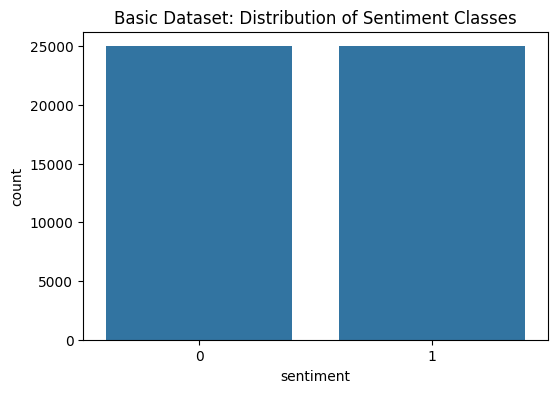

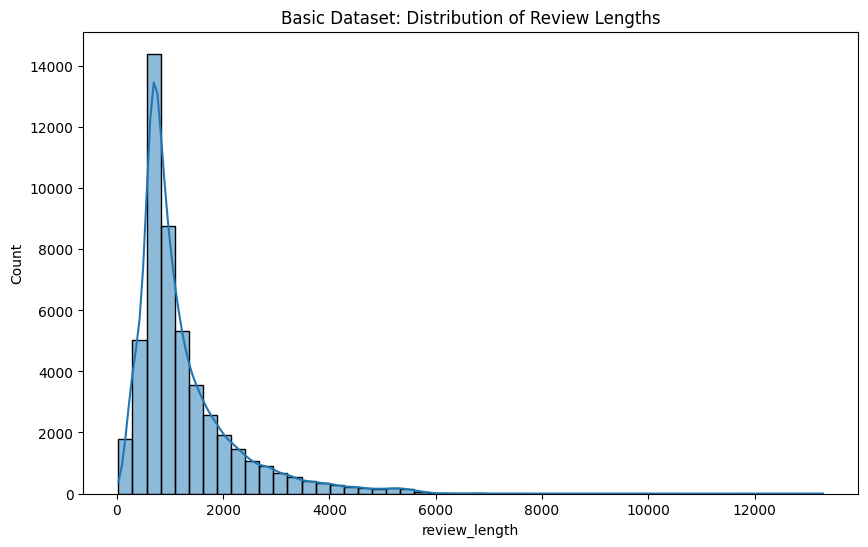

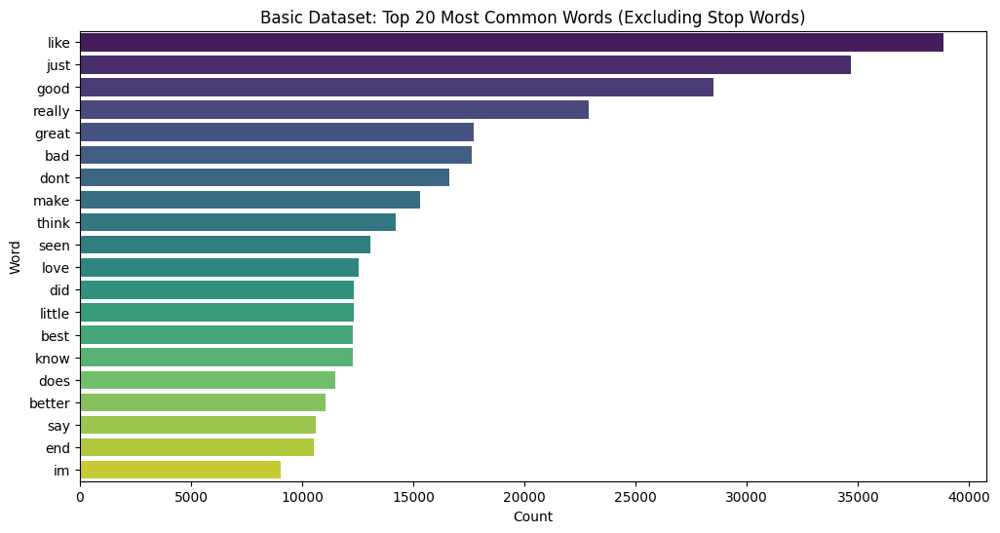


=== EDA for Advanced Dataset ===


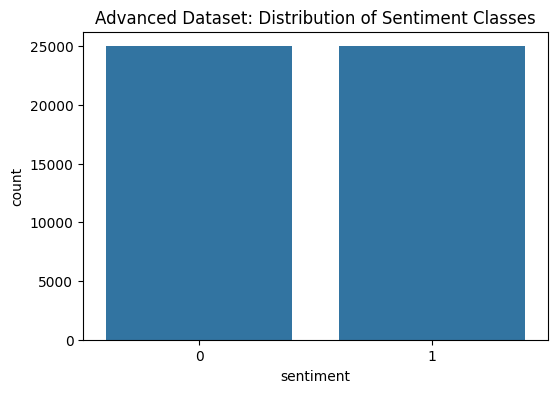

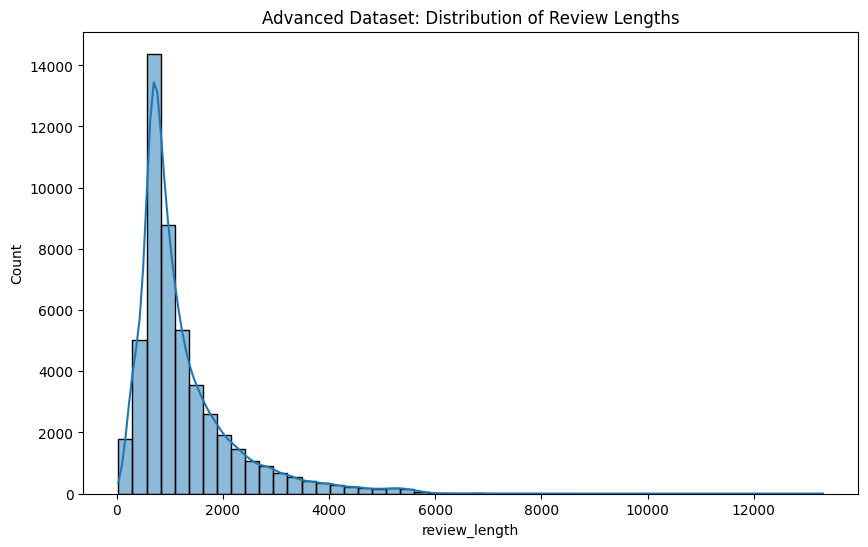

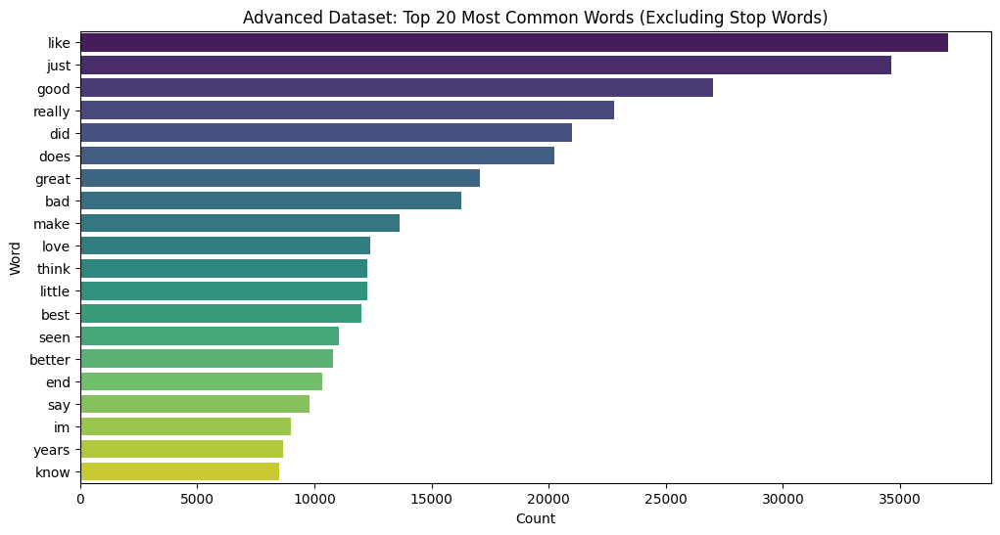

In [ ]:
WORDS_TO_REMOVE = {
    "film", "movie", "story", "plot", "script", "character", "role", "cast",
    "actor", "actress", "director", "scene", "shot", "camera", "dialogue",
    "performance", "ending", "beginning", "twist", "music", "soundtrack", "score",
    "review", "viewer", "reviewer", "watch", "version", "edition", "series", "episode",
    "season", "time", "minute", "hour", "runtime",
    "thing", "way", "part", "bit", "place", "world", "life", "moment", "person",
    "man", "woman", "guy", "girl", "child", "kid", "wife", "husband"
    "sort", "type", "act"
}

WORDS_TO_REMOVE = WORDS_TO_REMOVE | {f"{word}s" for word in WORDS_TO_REMOVE} | {
    "stories", "men", "women", "children", "people", "lives", "acting", "watching"
}
def plot_review_dataset_stats(df, title_prefix="Dataset"):
    """
    Generates:
      1. Sentiment distribution
      2. Review length distribution
      3. Top 20 most common words (excluding stopwords + domain words)
    """

    print(f"\n=== EDA for {title_prefix} ===")

    # 1. Sentiment Distribution
    plt.figure(figsize=(6, 4))
    sns.countplot(x='sentiment', data=df)
    plt.title(f'{title_prefix}: Distribution of Sentiment Classes')
    plt.show()

    # 2. Review Length Distribution
    df['review_length'] = df['review'].apply(len)
    plt.figure(figsize=(10, 6))
    sns.histplot(df['review_length'], bins=50, kde=True)
    plt.title(f'{title_prefix}: Distribution of Review Lengths')
    plt.show()

    # 3. Top 20 Most Common Words
    all_words = ' '.join(df['review']).split()
    filtered_words = [
        word for word in all_words
        if word not in ENGLISH_STOP_WORDS and word not in WORDS_TO_REMOVE
    ]
    common_words = Counter(filtered_words).most_common(20)

    words_df = pd.DataFrame(common_words, columns=['Word', 'Count'])
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Count', y='Word', data=words_df, palette='viridis', hue='Word', legend=False)
    plt.title(f'{title_prefix}: Top 20 Most Common Words (Excluding Stop Words)')
    plt.show()


plot_review_dataset_stats(movie_reviews_basic, title_prefix="Basic Dataset")
plot_review_dataset_stats(movie_reviews_advanced, title_prefix="Advanced Dataset")

### Data Preprocessing and Feature Engineering

Before modeling, the data underwent the following preprocessing steps:

*   **Train-Test Split**: The dataset was split into training (80%) and testing (20%) sets using `train_test_split` with stratification to ensure an even distribution of sentiment classes in both sets.
*   **Text Vectorization**: Text data ('review' column) was converted into numerical features using `TfidfVectorizer`. Stop words were removed, and the maximum number of features was set to 30,000 to manage dimensionality.

In [ ]:
# Data for basic cleaning models
X = movie_reviews_basic['review']
# Convert to binary
y = movie_reviews_basic['sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)


# Data for advanced cleaning models
X_adv = movie_reviews_advanced['review']
y_adv = movie_reviews_advanced['sentiment']
X_train_adv, X_test_adv, y_train_adv, y_test_adv = train_test_split(X_adv, y_adv, test_size=0.2, stratify=y_adv, random_state=42)


# 4. Modeling and Evaluation

### Model Training (Non LLMs)

Three different machine learning models were trained on the preprocessed training data: Multinomial Naive Bayes (`MultinomialNB`), Logistic Regression (`LogisticRegression`), and Linear Support Vector Classifier (`LinearSVC`). Each model was integrated into a `Pipeline` with the `TfidfVectorizer` to streamline the training process.
Here's what each of the three models is designed to do:

1.  **Multinomial Naive Bayes (`MultinomialNB`)**: This model is a probabilistic classifier based on Bayes' theorem, commonly used for text classification. It assumes that the features (words in this case) are conditionally independent given the class (sentiment). It's particularly effective for discrete features like word counts or TF-IDF values.
2.  **Logistic Regression (`LogisticRegression`)**: Despite its name, Logistic Regression is a linear model used for binary classification. It estimates the probability of an instance belonging to a particular class by fitting a logistic function to the data. It's known for its interpretability and efficiency, making it a strong baseline for text classification.
3.  **Linear Support Vector Classifier (`LinearSVC`)**: This model is a type of Support Vector Machine (SVM) that constructs a hyperplane or a set of hyperplanes in a high-dimensional space to separate data points into different classes. LinearSVC is specifically designed for cases where the data is linearly separable or when a linear decision boundary is sufficient, making it efficient for large-scale text classification tasks.

4. **Stochastic Gradient Descent Classifier (`SGDClassifier`)**:
The Stochastic Gradient Descent (SGD) classifier is a linear model trained using iterative, mini-batch updates rather than full-batch optimization. When paired with a hinge loss, it behaves like a linear Support Vector Machine; with log-loss, it approximates Logistic Regression. Because SGD updates the model incrementally, it is extremely efficient on high-dimensional sparse data such as TF-IDF vectors. This makes it well-suited for large-scale text classification tasks where speed and scalability are important, while still achieving accuracy comparable to other linear models.


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.pipeline import Pipeline
from sklearn.linear_model import SGDClassifier
from sklearn.base import clone # To clone the model

# use random_state for consistency
algos = [
    ('BAYES', MultinomialNB()),
    ('LOGREG', LogisticRegression(max_iter=200, random_state=42)),
    ('SVC', LinearSVC(random_state=42)),
    ('SGD', SGDClassifier(loss="hinge", alpha=1e-4, random_state=42))

]
TRAD_MODELS = ['BAYES','LOGREG', 'SVC', 'SGD']
TRAD_MODELS_ADV = [f"{m}_ADV" for m in TRAD_MODELS]
TRAD_MODELS_TRUNC = [f"{m}_TR"for m in TRAD_MODELS]
ALL_TRAD_MODELS = TRAD_MODELS + TRAD_MODELS_ADV + TRAD_MODELS_TRUNC

# List to store trained pipelines
trained_models = []
for name, model in algos:
    start  = time.time()
    pipe = Pipeline([
        ('tfidf', TfidfVectorizer(stop_words="english", max_features=30000)),
        (name, clone(model))
    ])

    print(f"\n=== TRAINING {name} ===")
    pipe.fit(X_train, y_train)
    end = time.time()
    total_time = end - start
    print(f"Training time: {total_time}")
    trained_models.append((name, pipe, total_time, DATASET.BASIC.value))
    print(f"TRAINING {name} COMPLETE")


# Train again on the advanced dataset
for name, model in algos:
    start  = time.time()
    name_adv = f"{name}_ADV"
    pipe = Pipeline([
        ('tfidf', TfidfVectorizer(stop_words="english", max_features=30000)),
        (name, clone(model))
    ])

    print(f"\n=== TRAINING {name_adv} ===")
    pipe.fit(X_train_adv, y_train_adv)
    end = time.time()
    total_time = end - start
    print(f"Training time: {total_time}")
    trained_models.append((name_adv, pipe, total_time, DATASET.ADV.value))
    print(f"TRAINING {name_adv} COMPLETE")


=== TRAINING BAYES ===
Training time: 5.086525917053223
TRAINING BAYES COMPLETE

=== TRAINING LOGREG ===
Training time: 6.881195306777954
TRAINING LOGREG COMPLETE

=== TRAINING SVC ===
Training time: 6.655642032623291
TRAINING SVC COMPLETE

=== TRAINING SGD ===
Training time: 5.562867879867554
TRAINING SGD COMPLETE

=== TRAINING BAYES_ADV ===
Training time: 5.345976829528809
TRAINING BAYES_ADV COMPLETE

=== TRAINING LOGREG_ADV ===
Training time: 6.473615646362305
TRAINING LOGREG_ADV COMPLETE

=== TRAINING SVC_ADV ===
Training time: 7.3916380405426025
TRAINING SVC_ADV COMPLETE

=== TRAINING SGD_ADV ===
Training time: 5.594924449920654
TRAINING SGD_ADV COMPLETE


### Model Performance Evaluation

Each trained model was evaluated on the test set using several key metrics:

*   **Accuracy, Precision, Recall, and F1-Score**: These metrics were calculated, and their weighted averages were used to account for potential class imbalances, providing a comprehensive view of model performance. The results are visualized in a bar chart, clearly indicating that Logistic Regression achieved the highest scores across these metrics.

Prediction time BAYES: 1.27s
Prediction time LOGREG: 1.31s
Prediction time SVC: 1.24s
Prediction time SGD: 1.23s
Prediction time BAYES_ADV: 1.25s
Prediction time LOGREG_ADV: 1.24s
Prediction time SVC_ADV: 1.24s
Prediction time SGD_ADV: 1.24s

--- Processing Traditional Models ---
  BAYES: Accuracy=0.864, F1-Score=0.863
              precision    recall  f1-score   support

           0       0.86      0.87      0.86      5000
           1       0.87      0.86      0.86      5000

    accuracy                           0.86     10000
   macro avg       0.86      0.86      0.86     10000
weighted avg       0.86      0.86      0.86     10000

  LOGREG: Accuracy=0.897, F1-Score=0.897
              precision    recall  f1-score   support

           0       0.91      0.89      0.90      5000
           1       0.89      0.91      0.90      5000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      

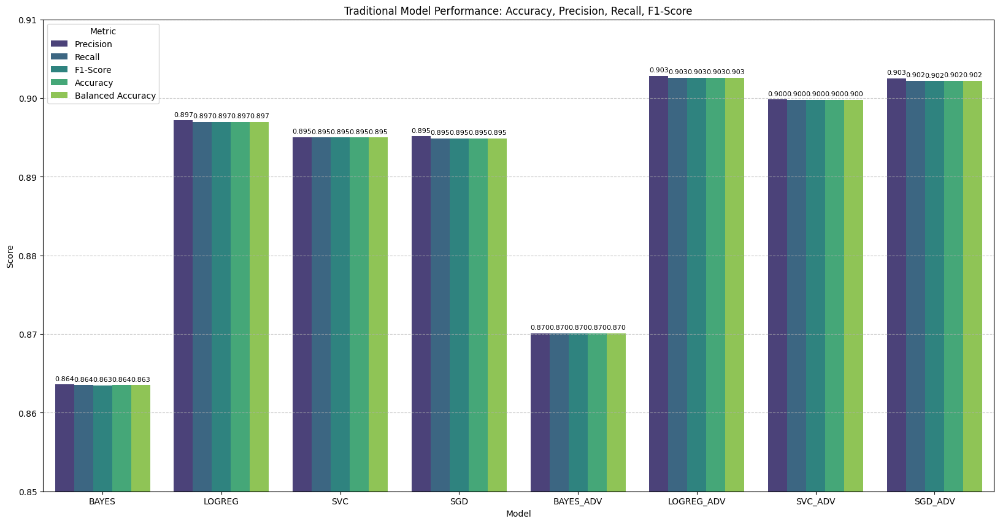

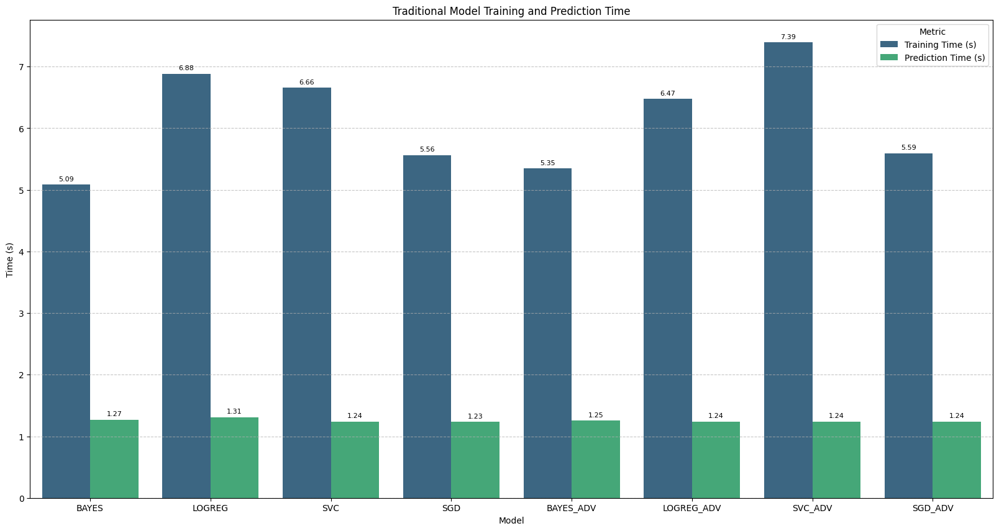

In [ ]:
traditional_outputs = [] # New list to store predictions and related info

TIME_COLS = ['Prediction Time (s)','Training Time (s)' ]
for name, pipe, total_time, mod in trained_models:
    # Select the appropriate X_test and y_test based on the 'mod' flag
    if mod == DATASET.ADV.value:
        X_test_actual, y_true_actual = X_test_adv, y_test_adv
    else:
        X_test_actual, y_true_actual = X_test, y_test

    start_pred = time.time()
    preds = pipe.predict(X_test_actual)
    end_pred = time.time()
    pred_time = end_pred - start_pred
    print(f"Prediction time {name}: {pred_time:.2f}s")

    # Store results in traditional_outputs
    traditional_outputs.append({
        'name': name,
        'y_pred': preds,
        'y_true': y_true_actual,
        'X_test_text': X_test_actual, # Store X_test_actual for misclassification analysis
        'pred_time': pred_time, # Store prediction time
        'train_time': total_time # Store training time
    })

# Now, process the collected traditional_outputs
trad_metrics_df, trad_time_df, trad_cm_plotters = process_model_outputs(traditional_outputs, "Traditional")

plot_model_metrics(
    trad_metrics_df,
    title="Traditional Model Performance: Accuracy, Precision, Recall, F1-Score",
    ylim=(0.85, 0.91),
    fmt="%.3f"
)

plot_model_metrics(
    trad_time_df,
    title="Traditional Model Training and Prediction Time",
    y_label="Time (s)",
    fmt="%.2f"
)

### Accuracy Metrics Summary

Based on the "Model Performance: Accuracy, Precision, Recall, and F1-Score", we can observe the following accuracy scores for each model:

*   **Multinomial Naive Bayes (BAYES)**: Achieved the lowest metrics, hovering around **86-87%**.
*   **Logistic Regression (LOGREG)**: Demonstrated the highest accuracy among the four models, at over **90%**.
*   **Linear Support Vector Classifier (SVC)**: Performed very similarly to, but slightly below Logistic Regression.
*   **SGD classifier (SGD)**: Demonstrated the peer-to-peer accuracy compared to Logistic Regression.

These results indicate that both Logistic Regression, SGD, and Linear SVC are significantly more accurate than the Multinomial Naive Bayes model for this sentiment classification task.

### Time Metrics Summary

Based on multiple runs, the time metrics are not consistent, as certain models may take shorter or longer to run depending on the state of the hardware. However, it will be a useful metric for comparison vs LLM. For now, let's assume that all three traditional ML models have approximately the same time metrics.


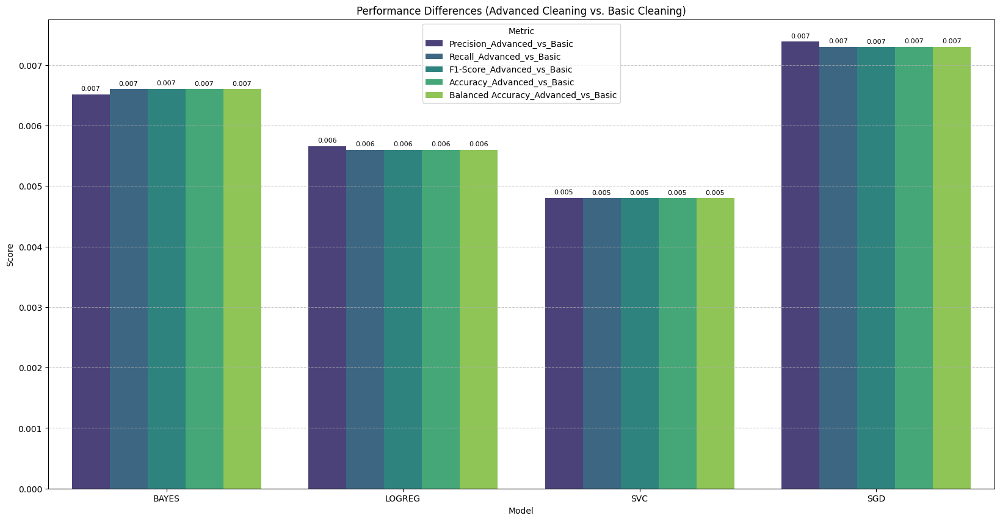

In [ ]:
# 1. Filter the metrics_df DataFrame for relevant models
filtered_metrics_df = trad_metrics_df[trad_metrics_df['Model'].isin(ALL_TRAD_MODELS)].copy()

# Prepare to store the differences
difference_metrics = []

# Get unique metric types
metric_types = filtered_metrics_df['Metric'].unique()

# 3. For each metric type, calculate the difference
for metric_type in metric_types:
    for base_model_name in TRAD_MODELS:
        adv_model_name = f'{base_model_name}_ADV'

        # Get scores for the basic version
        basic_score = filtered_metrics_df[
            (filtered_metrics_df['Model'] == base_model_name) &
            (filtered_metrics_df['Metric'] == metric_type)
        ]['Score'].iloc[0]

        # Calculate difference: Advanced - Basic
        adv_score = filtered_metrics_df[
            (filtered_metrics_df['Model'] == adv_model_name) &
            (filtered_metrics_df['Metric'] == metric_type)
        ]['Score'].iloc[0]
        diff_adv_score = adv_score - basic_score
        difference_metrics.append({
            'Model': base_model_name, # Use base model name for consistency
            'Metric': f'{metric_type}_Advanced_vs_Basic',
            'Score': diff_adv_score
        })


difference_df = pd.DataFrame(difference_metrics)
plot_model_metrics(
    difference_df,
    title="Performance Differences (Advanced Cleaning vs. Basic Cleaning)"
)

## Confusion Matrices

Confusion matrices were generated for all three traditional machine-learning models to provide a detailed breakdown of correct and incorrect classifications (True Positives, True Negatives, False Positives, and False Negatives). These matrices were visualized as heatmaps, making it easy to compare how effectively each model identifies positive and negative sentiment.

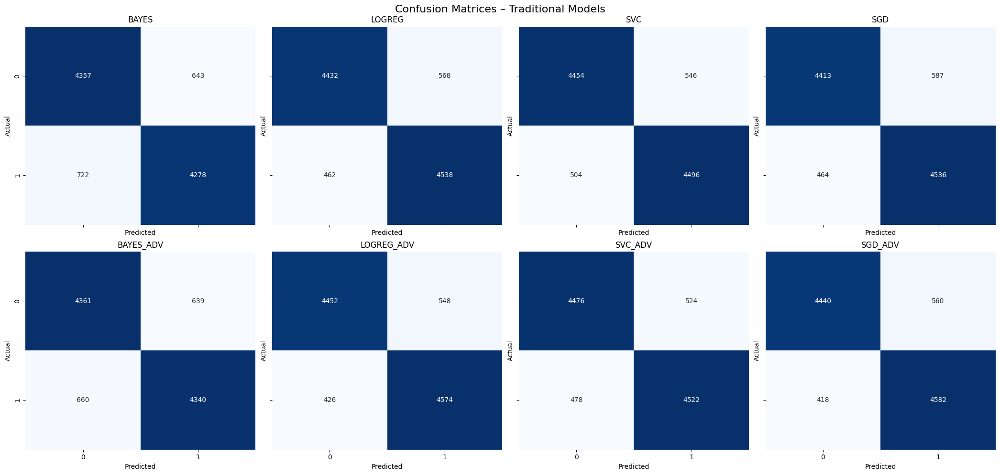

(<Figure size 2080x960 with 8 Axes>, <numpy.flatiter at 0x366655d0>)

In [ ]:
plot_grid(
    trad_cm_plotters, # Use the list generated by process_model_outputs
    n_cols=4,
    figsize_per_plot=(5.2, 4.8),
    suptitle="Confusion Matrices – Traditional Models"
)

## Analysis of Misclassification Word Changes with Advanced Cleaning

This section compares the words that frequently lead to False Positives (FP) and False Negatives (FN) for each traditional model, contrasting the results obtained with basic text cleaning versus advanced text cleaning. We'll examine:

*   **Words unique to basic cleaning**: Words that were frequently misclassified with basic cleaning but were *not* frequently misclassified with advanced cleaning (suggesting improvement).
*   **Words unique to advanced cleaning**: Words that were *not* frequently misclassified with basic cleaning but *were* frequently misclassified with advanced cleaning (suggesting new misclassification patterns).
*   **Common misclassified words**: Words that frequently led to misclassifications in both basic and advanced cleaning scenarios (indicating persistent challenges).



### Feature Importance


To justify the value of independent variables, we analyze the coefficients (or log-odds for Naive Bayes) of the traditional models. This reveals which words contribute most to positive or negative classifications across different algorithms. This gives the explainability, or transparency needed for real-time business use cases.


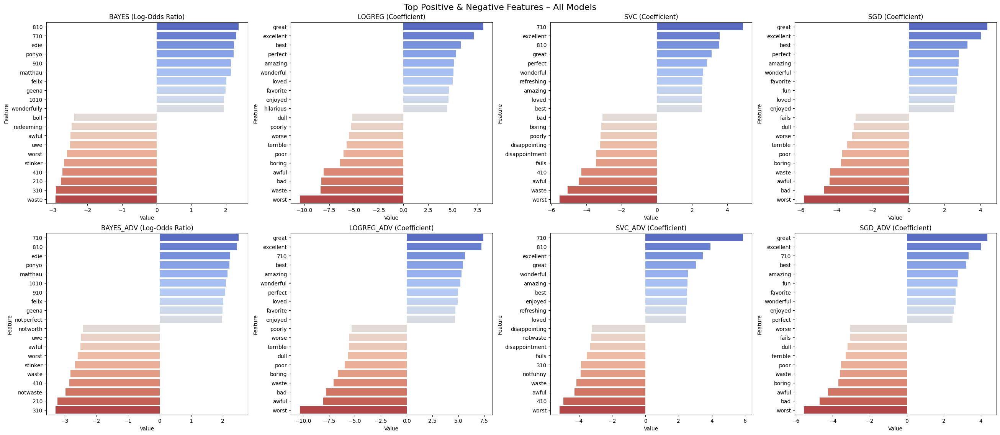

(<Figure size 2600x1100 with 8 Axes>, <numpy.flatiter at 0x36711fe0>)

In [ ]:
# ── Now prepare one plotter per model ──
def make_feature_plotter(name, pipe, class_labels=None):  # class_labels optional
    def plotter(ax):
        vectorizer = pipe.named_steps['tfidf']

        # Extract classifier step name (your logic)
        classifier_step_name = name.split('_ADV')[0]
        classifier = pipe.named_steps[classifier_step_name]

        feature_names = vectorizer.get_feature_names_out()

        if classifier_step_name.startswith('BAYES'):
            coefs = classifier.feature_log_prob_[1] - classifier.feature_log_prob_[0]
            title_suffix = "(Log-Odds Ratio)"
        elif hasattr(classifier, 'coef_'):
            coefs = classifier.coef_.flatten()
            title_suffix = "(Coefficient)"
        else:
            ax.text(0.5, 0.5, "No coefficients available", ha='center', va='center')
            ax.set_title(name.upper())
            return

        # Create and sort DataFrame
        df = pd.DataFrame({'Feature': feature_names, 'Value': coefs})
        df = df.sort_values(by='Value', ascending=False)

        top_pos = df.head(10)
        top_neg = df.tail(10)
        top_features = pd.concat([top_pos, top_neg])

        # Plot on the given ax
        sns.barplot(
            x='Value', y='Feature', data=top_features,
            palette='coolwarm', ax=ax, hue='Feature', legend=False
        )
        ax.set_title(f'{name.upper()} {title_suffix}')
        # Optional: ax.set_xlabel('Importance') etc.

    return plotter


# ── Collect all plotters ──
plotters = [
    make_feature_plotter(name, pipe)
    for name, pipe, _, _ in trained_models   # assuming trained_models is your list
]

# ── Plot everything with auto-wrapping ──
plot_grid(
    plotters,
    n_cols=4,                             # ← change to 2, 4, whatever fits your screen
    figsize_per_plot=(6.5, 5.5),          # tune width/height per plot
    suptitle="Top Positive & Negative Features – All Models",
    sharex=False,
    sharey=False
)


## Quantitative Change in False Positives and False Negatives with Advanced Cleaning

This section quantifies the change in False Positive (FP) and False Negative (FN) counts for each traditional model when comparing basic versus advanced text cleaning. A positive difference means an increase in misclassifications with advanced cleaning, while a negative difference indicates a reduction.


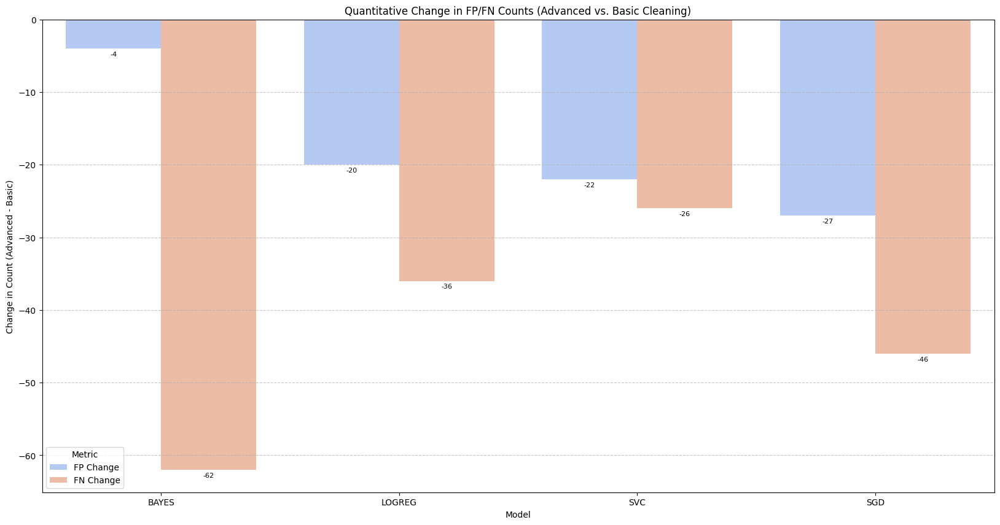

In [ ]:
fp_fn_counts = {}

# Populate fp_fn_counts using stored predictions
for model_info in traditional_outputs:
    name = model_info['name']
    y_pred = model_info['y_pred']
    y_true = model_info['y_true']

    cm = confusion_matrix(y_true, y_pred, labels=[0,1])

    TN, FP, FN, TP = cm.ravel()
    fp_fn_counts[name] = {'FP': FP, 'FN': FN}

# Prepare data for plotting
fp_fn_diff_data = []

for model_type in TRAD_MODELS:
    basic_fp = fp_fn_counts[model_type]['FP']
    basic_fn = fp_fn_counts[model_type]['FN']

    adv_fp = fp_fn_counts[f'{model_type}_ADV']['FP']
    adv_fn = fp_fn_counts[f'{model_type}_ADV']['FN']

    fp_diff = adv_fp - basic_fp
    fn_diff = adv_fn - basic_fn

    fp_fn_diff_data.append({'Model': model_type, 'Metric': 'FP Change', 'Score': fp_diff})
    fp_fn_diff_data.append({'Model': model_type, 'Metric': 'FN Change', 'Score': fn_diff})

fp_fn_diff_df = pd.DataFrame(fp_fn_diff_data)

plot_model_metrics(
    fp_fn_diff_df,
    title="Quantitative Change in FP/FN Counts (Advanced vs. Basic Cleaning)",
    y_label="Change in Count (Advanced - Basic)",
    fmt="%.0f",
    palette="coolwarm"
)




### Key Findings

- **Bayes Model:**  
  The Bayes classifier shows balanced performance but tends to produce slightly more misclassifications than the other models. It typically exhibits higher rates of both False Positives and False Negatives, reflecting its simpler probabilistic assumptions.

- **Logistic Regression (LogReg):**  
  Logistic Regression consistently delivers the strongest confusion-matrix performance among the traditional models. It generally achieves the **highest number of correct predictions** (both True Positives and True Negatives) and the **low number of misclassifications**, especially False Negatives. This indicates strong reliability in identifying positive sentiment.

- **SGD Classifier**:
  The SGD performs on par with Logistic Regression, with similarly competitive True Positive and True Negative Counts. A tie-breaker with Logistic Regression.

- **Support Vector Classifier (SVC):**  
  The SVC model performs similarly to Logistic Regression, with competitive True Positive and True Negative counts. However, it typically shows a slightly higher number of misclassifications compared to LogReg, making it the one of the close-to-best performers overall.




### Advanced vs Basic Cleaning:
Advanced text cleaning led to a modest but consistent improvement across all traditional models. Specifically:

Performance Metrics (Accuracy, Precision, Recall, F1-score): All models saw gains ranging from approximately 0.5% to 0.7%. The Naive Bayes and SGD models benefited the most, with an improvement of about 0.6% and 0.7%, respectively, across its metrics. Logistic Regression and SVC showed slightly smaller, but still positive, improvements of around 0.50%.

Misclassification Counts (False Positives and False Negatives): Advanced cleaning consistently reduced both False Positives (FP) and False Negatives (FN) for all models:

- **Naive Bayes**: Saw a significant reduction of at least 50 FNs, while it may have an immaterial increase in FPs.
- **Logistic Regression**: Experienced a decrease of at least 10 FPs and 30 FNs.

- **SVC**: Had a reduction of at least 20 FPs and FNs.

- **SGD**: Had a redction of at least 20 FPs and 40 FNs.

In summary, advanced cleaning, particularly through negation grouping and contraction expansion, helped reduce misclassifications and slightly boost overall performance for all traditional models, with Naive Bayes showing the most pronounced benefits.


### Insights or Next Steps

- **Logistic Regression, SGD, and Linear SVC remains the strongest traditional model**, offering the best balance of True Positives, True Negatives, and minimal misclassification. It also benefits from fast training and prediction times, making it highly practical for real-world deployment.

- **Next Step:**  

  Compare these traditional ML models to a fine-tuned Large Language Model (LLM) or Neural networks (NN) to evaluate whether traditional models are as competitive for this case vs NNs or LLMs.

## Neural Networks (NNs)

Neural Networks represent a powerful class of machine learning models inspired by the structure and function of the human brain. They consist of interconnected nodes (neurons) organized in layers, designed to learn complex patterns and relationships within data. For natural language processing tasks like sentiment analysis, neural networks are particularly adept at capturing intricate linguistic features and contextual information that traditional models often miss. Unlike classical models that rely on hand-crafted features, NNs can automatically learn hierarchical representations directly from raw text, making them highly effective for tasks where nuanced understanding of language is crucial.

Key advantages of using neural networks for sentiment analysis include their ability to:

*   **Capture complex patterns**: NNs can model non-linear relationships between words and sentiments.
*   **Learn distributed representations**: Words are transformed into dense vector embeddings, allowing the model to understand semantic similarities.
*   **Handle sequential data**: Recurrent architectures like LSTMs are specifically designed to process sequences, making them ideal for text.
*   **Reduce feature engineering**: Features are learned directly from the data, reducing the need for extensive manual preprocessing.

In this section, we will explore two types of neural networks: Long Short-Term Memory (LSTM) and Convolutional Neural Networks (CNNs), and evaluate their performance on the IMDB sentiment analysis dataset.

## Long Short-Term Memory Network (LSTM)
An LSTM is a type of recurrent neural network designed to capture sequential patterns and long-range dependencies in text. Unlike traditional bag-of-words or TF-IDF models, which treat documents as unordered collections of terms, an LSTM processes text as a sequence of tokens, allowing it to learn contextual relationships between words. This makes it particularly effective for sentiment analysis, where meaning often depends on word order and phrasing. In this project, the LSTM was implemented using an embedding layer followed by recurrent units and a dense output layer, enabling the model to learn distributed representations of text and classify sentiment based on learned patterns in the sequence.

In [ ]:
def clean_text_nn(text):
    # Remove HTML tags
    text = re.sub(r'<.*?>', '', text)

    # Lowercase
    text = text.lower()

    # --- Contraction expansion (before negation grouping) ---
    for pattern, replacement in CONTRACTIONS.items():
        text = re.sub(pattern, replacement, text)

    # Remove most of other symbols
    text = re.sub(r'[^a-zA-Z0-9\s\'\"\\\-]', '', text)
    return text

movie_reviews_nn = reviews.copy(deep=True)
movie_reviews_nn['review'] = movie_reviews_nn['review'].apply(clean_text_nn)
display(movie_reviews_nn.head())

,review,sentiment
0,one of the other reviewers has mentioned that ...,1
1,a wonderful little production the filming tech...,1
2,i thought this was a wonderful way to spend ti...,1
3,basically there's a family where a little boy ...,0
4,"petter mattei's ""love in the time of money"" is...",1


In [ ]:
X_nn = movie_reviews_nn['review']
y_nn = movie_reviews_nn['sentiment']
X_train_nn, X_test_nn, y_train_nn, y_test_nn = train_test_split(X_nn, y_nn, test_size=0.2, random_state=42)

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import (
    Embedding, Bidirectional, LSTM, Dense,
    Dropout, SpatialDropout1D, Conv1D,
    GlobalMaxPooling1D, GlobalAveragePooling1D,
    GRU
)
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam

def prepare_sequences(X_train, X_test, y_train, y_test, max_words, max_sequence_length):
    tokenizer = Tokenizer(num_words=max_words, oov_token="<unk>")
    tokenizer.fit_on_texts(X_train)

    X_train_seq = tokenizer.texts_to_sequences(X_train)
    X_test_seq = tokenizer.texts_to_sequences(X_test)

    X_train_pad = pad_sequences(X_train_seq, maxlen=max_sequence_length, padding='post', truncating='post')
    X_test_pad = pad_sequences(X_test_seq, maxlen=max_sequence_length, padding='post', truncating='post')

    return X_train_pad, X_test_pad, y_train, y_test

def train_and_evaluate(model, X_train, y_train, X_test, y_test, epochs, batch_size):
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1)

    start_train = time.time()
    history = model.fit(
        X_train, y_train,
        validation_split=0.2,
        epochs=epochs,
        batch_size=batch_size,
        callbacks=[early_stopping, reduce_lr],
        verbose=1
    )
    train_time = time.time() - start_train

    start_pred = time.time()
    proba = model.predict(X_test)
    pred_time = time.time() - start_pred
    preds = (proba > 0.5).astype(int).flatten()

    return train_time, pred_time, preds

# Define common parameters for NN models
nn_model_params = {
    'batch_size': 128,
    'max_words': 10000,
    'max_sequence_length': 1024, # Adjusted for typical NN efficiency
    'embedding_dim': 128,
    'dropout_rate': 0.5
}

nn_outputs = []

def run_and_store_nn_results(build_model_fn, model_name, X_train, y_train, X_test, y_test, epochs, **model_specific_kwargs):
    """
    Generic function to run an NN model, evaluate it, and store results.
    """
    Xtr, Xte, ytr, yte = prepare_sequences(
        X_train, X_test, y_train, y_test,
        nn_model_params["max_words"], nn_model_params["max_sequence_length"]
    )

    # Combine common and model-specific kwargs
    all_kwargs = {**nn_model_params, **model_specific_kwargs}

    model = build_model_fn(
        max_words=all_kwargs["max_words"],
        embedding_dim=all_kwargs["embedding_dim"],
        dropout_rate=all_kwargs["dropout_rate"],
        **model_specific_kwargs
    )
    model.summary()

    train_time, pred_time, preds = train_and_evaluate(
        model, Xtr, ytr, Xte, yte,
        epochs,
        all_kwargs["batch_size"]
    )

    nn_outputs.append({
        'name': model_name,
        'y_pred': preds,
        'y_true': yte,
        'train_time': train_time,
        'pred_time': pred_time,
        'X_test_text': X_test
    })

    print(f"Finished running {model_name} model.")


In [ ]:
def build_lstm(max_words, embedding_dim, lstm_units, dropout_rate):
    model = Sequential(name="BiLSTM_Sentiment")
    model.add(Embedding(max_words, embedding_dim, mask_zero=True))
    model.add(SpatialDropout1D(0.25))
    model.add(Bidirectional(LSTM(lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(
        optimizer=Adam(1e-3),
        loss='binary_crossentropy',
        metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
    )
    return model

# Run the LSTM model and get results using the generic function
run_and_store_nn_results(
    build_lstm, "LSTM",
    X_train_nn, y_train_nn, X_test_nn, y_test_nn,
    epochs=3, lstm_units=72
)


Model: "BiLSTM_Sentiment"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding (Embedding)           │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spatial_dropout1d               │ ?                      │             0 │
│ (SpatialDropout1D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

Epoch 1/3
250/250 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.6903 - auc: 0.7622 - loss: 0.5483 - val_accuracy: 0.8794 - val_auc: 0.9530 - val_loss: 0.2845 - learning_rate: 0.0010
Epoch 2/3
250/250 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.9084 - auc: 0.9615 - loss: 0.2476 - val_accuracy: 0.8856 - val_auc: 0.9528 - val_loss: 0.3275 - learning_rate: 0.0010
Epoch 3/3
250/250 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.9378 - auc: 0.9794 - loss: 0.1796 - val_accuracy: 0.8789 - val_auc: 0.9516 - val_loss: 0.3639 - learning_rate: 0.0010
Restoring model weights from the end of the best epoch: 1.
313/313 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step
Finished running LSTM model.


## Convolutional Neural Network (CNN)

A Convolutional Neural Network (CNN) is another type of deep learning model that has found surprising success in Natural Language Processing (NLP), even though it was originally designed for image processing. For text, CNNs operate by using filters (or kernels) that slide over sequences of words (or word embeddings) to detect local patterns, such as n-grams or phrases. Each filter extracts features by performing a convolution operation, and these features are then typically pooled (e.g., using max-pooling) to reduce dimensionality and retain the most important information.

In the context of sentiment analysis, a CNN can identify key sentiment-bearing phrases or words regardless of their position in a review. For example, a filter might learn to recognize phrases like "not good" or "highly recommended" as indicative of negative or positive sentiment, respectively. The model then combines these local patterns to form a global understanding of the review's overall sentiment. This makes CNNs efficient at capturing salient features from text, offering a robust alternative to recurrent networks for sequence classification tasks.

In [ ]:
def build_cnn(max_words, embedding_dim, filters, kernel_size, dropout_rate):
    model = Sequential(name="CNN_Sentiment")
    model.add(Embedding(max_words, embedding_dim))
    model.add(Dropout(0.2))
    model.add(Conv1D(filters, kernel_size, activation='relu'))
    model.add(GlobalMaxPooling1D())
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(
        optimizer=Adam(1e-3),
        loss='binary_crossentropy',
        metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
    )
    return model

# Run the CNN model and get results using the generic function
run_and_store_nn_results(
    build_cnn, "CNN",
    X_train_nn, y_train_nn, X_test_nn, y_test_nn,
    epochs=3, filters=128, kernel_size=5
)


Model: "CNN_Sentiment"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_1 (Embedding)         │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d (Conv1D)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d            │ ?                      │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

Epoch 1/3
250/250 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step - accuracy: 0.6277 - auc: 0.6861 - loss: 0.6143 - val_accuracy: 0.8754 - val_auc: 0.9489 - val_loss: 0.2940 - learning_rate: 0.0010
Epoch 2/3
250/250 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - accuracy: 0.9019 - auc: 0.9600 - loss: 0.2570 - val_accuracy: 0.8974 - val_auc: 0.9643 - val_loss: 0.2461 - learning_rate: 0.0010
Epoch 3/3
250/250 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - accuracy: 0.9516 - auc: 0.9859 - loss: 0.1481 - val_accuracy: 0.8996 - val_auc: 0.9655 - val_loss: 0.2560 - learning_rate: 0.0010
Restoring model weights from the end of the best epoch: 2.
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Finished running CNN model.


## Gated Recurrent Unit (GRU)

A Gated Recurrent Unit (GRU) is a type of recurrent neural network (RNN) that is a simpler and more computationally efficient alternative to the Long Short-Term Memory (LSTM) network. Like LSTMs, GRUs are designed to address the vanishing gradient problem inherent in standard RNNs, allowing them to learn long-term dependencies in sequential data.

The key difference between GRUs and LSTMs lies in their internal structure. GRUs have two gates (an update gate and a reset gate) compared to LSTM's three (input, forget, and output gates). This reduced complexity means GRUs have fewer parameters, making them faster to train and less prone to overfitting on smaller datasets, while often achieving comparable performance to LSTMs in many NLP tasks, including sentiment analysis. They are particularly well-suited for situations where computational resources are a concern or when a more streamlined model is preferred.

In [ ]:
def build_gru(max_words, embedding_dim, gru_units, dropout_rate):
    model = Sequential(name="BiGRU_Sentiment")
    model.add(Embedding(max_words, embedding_dim, mask_zero=True))
    model.add(SpatialDropout1D(0.25))
    model.add(Bidirectional(GRU(gru_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(
        optimizer=Adam(1e-3),
        loss='binary_crossentropy',
        metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
    )
    return model

# Run the GRU model and get results using the generic function
run_and_store_nn_results(
    build_gru, "GRU",
    X_train_nn, y_train_nn, X_test_nn, y_test_nn,
    epochs=3, gru_units=72
)


Model: "BiGRU_Sentiment"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_2 (Embedding)         │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spatial_dropout1d_1             │ ?                      │             0 │
│ (SpatialDropout1D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

Epoch 1/3
250/250 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.6146 - auc: 0.6731 - loss: 0.6219 - val_accuracy: 0.8635 - val_auc: 0.9470 - val_loss: 0.3333 - learning_rate: 0.0010
Epoch 2/3
250/250 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.8953 - auc: 0.9558 - loss: 0.2680 - val_accuracy: 0.8888 - val_auc: 0.9568 - val_loss: 0.2734 - learning_rate: 0.0010
Epoch 3/3
250/250 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.9331 - auc: 0.9775 - loss: 0.1870 - val_accuracy: 0.8907 - val_auc: 0.9555 - val_loss: 0.2965 - learning_rate: 0.0010
Restoring model weights from the end of the best epoch: 2.
313/313 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step
Finished running GRU model.


## Multi-Layer Perceptron (MLP) with Word Embeddings

A Multi-Layer Perceptron (MLP), also known as a feed-forward neural network, is one of the simplest and most fundamental types of artificial neural networks. When used for text classification tasks like sentiment analysis, MLPs typically do not process raw text directly. Instead, they operate on numerical representations of text, most commonly word embeddings.

The process involves converting words or phrases into dense, continuous vector representations (embeddings) that capture semantic and syntactic information. These embeddings can be pre-trained on large text corpora (e.g., Word2Vec, GloVe, FastText) or learned during the training process. For a given review, the word embeddings are often aggregated (e.g., averaged, concatenated, or pooled) to form a fixed-size document vector, which then serves as the input to the MLP. The MLP consists of multiple fully connected layers with non-linear activation functions, culminating in an output layer that produces the sentiment prediction. While MLPs lack the sequential processing capabilities of RNNs or the contextual understanding of Transformers, they can still perform effectively, especially with high-quality word embeddings, offering a computationally efficient and interpretable baseline.

In [ ]:
def build_mlp(max_words, embedding_dim, dropout_rate):
    model = Sequential(name="MLP_Sentiment")
    model.add(Embedding(max_words, embedding_dim))
    model.add(GlobalAveragePooling1D()) # Aggregates the embeddings into a single vector
    model.add(Dropout(dropout_rate))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(
        optimizer=Adam(1e-3),
        loss='binary_crossentropy',
        metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
    )
    return model

# Run the MLP model and get results using the generic function
run_and_store_nn_results(
    build_mlp, "MLP",
    X_train_nn, y_train_nn, X_test_nn, y_test_nn,
    epochs=25
)


Model: "MLP_Sentiment"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_3 (Embedding)         │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d        │ ?                      │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
250/250 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - accuracy: 0.5050 - auc: 0.5052 - loss: 0.6957 - val_accuracy: 0.5000 - val_auc: 0.6496 - val_loss: 0.6926 - learning_rate: 0.0010
Epoch 2/25
250/250 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5122 - auc: 0.5205 - loss: 0.6929 - val_accuracy: 0.5337 - val_auc: 0.6913 - val_loss: 0.6855 - learning_rate: 0.0010
Epoch 3/25
250/250 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.5669 - auc: 0.5898 - loss: 0.6801 - val_accuracy: 0.5956 - val_auc: 0.8059 - val_loss: 0.6319 - learning_rate: 0.0010
Epoch 4/25
250/250 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6647 - auc: 0.7312 - loss: 0.6063 - val_accuracy: 0.7138 - val_auc: 0.8891 - val_loss: 0.5227 - learning_rate: 0.0010
Epoch 5/25
250/250 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.7374 - auc: 0.8164 - loss: 0.5244 - val_accuracy: 0.6585 - val_auc: 0.9080 - val_loss: 0.5496 - learning_rate: 0.0010
Epoch 6/25
250/250 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.7609 - a


--- Processing Neural Network Models ---
  LSTM: Accuracy=0.885, F1-Score=0.885
              precision    recall  f1-score   support

           0       0.87      0.90      0.89      4961
           1       0.90      0.87      0.88      5039

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000

  CNN: Accuracy=0.899, F1-Score=0.899
              precision    recall  f1-score   support

           0       0.93      0.87      0.89      4961
           1       0.88      0.93      0.90      5039

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000

  GRU: Accuracy=0.890, F1-Score=0.890
              precision    recall  f1-score   support

           0       0.88      0.90      0.89      4961
           1       0.90      0.88      0.89      5039

    accuracy             

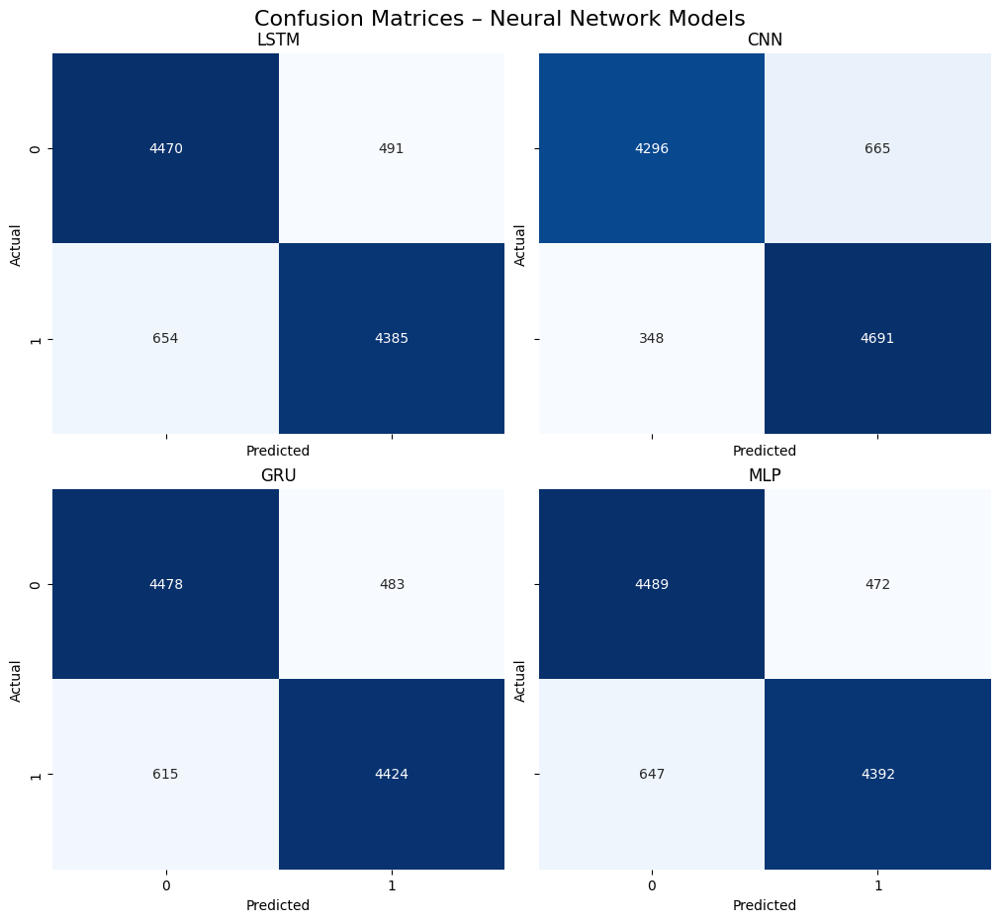

(<Figure size 1000x900 with 4 Axes>, <numpy.flatiter at 0x5025aa90>)

In [ ]:
nn_metrics_df, nn_time_df, nn_cm_plotters = process_model_outputs(nn_outputs, "Neural Network")

# Create plotters for all processed NN models
plot_grid(
    nn_cm_plotters,
    n_cols=2,
    figsize_per_plot=(5.0, 4.5),
    suptitle="Confusion Matrices – Neural Network Models",
    sharex=True,
    sharey=True
)

## LLM-based Modeling

### Introducing Large Language Models (LLMs) for Sentiment Analysis

While traditional machine learning models like Naive Bayes, Logistic Regression, and SVMs have proven effective for sentiment analysis, the field has seen a significant shift towards Large Language Models (LLMs). These advanced neural network architectures, pre-trained on vast amounts of text data, offer unparalleled capabilities in understanding context, semantics, and nuances within human language.

Prominent examples of these architectures include **BERT (Bidirectional Encoder Representations from Transformers)**. BERT's strength lies in its ability to process words in relation to all other words in a sentence, capturing rich contextual information that traditional models often miss. This bidirectionality and deep understanding of language structure allow them to generate highly accurate and sophisticated text representations.

The potential benefits of employing LLMs for sentiment analysis, especially compared to the traditional machine learning models explored previously, are substantial:

*   **Improved Accuracy**: LLMs can capture subtle emotional cues and complex linguistic patterns, leading to more accurate sentiment predictions, especially in ambiguous or nuanced texts.
*   **Superior Contextual Understanding**: Unlike word-by-word processing, LLMs understand the full context of a sentence, which is crucial for distinguishing between sarcasm, irony, and other complex sentiment expressions.
*   **Reduced Feature Engineering**: LLMs automatically learn powerful features from raw text during pre-training, significantly reducing the need for manual feature engineering that is often required for traditional models.
*   **Transfer Learning Capabilities**: Pre-trained LLMs can be fine-tuned on smaller, task-specific datasets with relatively little data, leveraging the vast knowledge acquired during their initial training phase. This makes them highly adaptable to various domain-specific sentiment analysis tasks.
*   **Handling of Long-Range Dependencies**: Their transformer architecture allows LLMs to model long-range dependencies in text, which is vital for understanding sentiment in longer reviews where sentiment might be expressed across multiple sentences.

### Tokenization and Encoding for LLM Input

To prepare the movie review data for an LLM, we need to tokenize the text and encode the sentiment labels into a format suitable for model training. This involves using a pre-trained tokenizer from the Hugging Face Transformers library to convert text reviews into input IDs, attention masks, and token type IDs. Additionally, the categorical sentiment labels ('positive' and 'negative') will be mapped to numerical values (1 and 0, respectively) and converted into PyTorch tensors.

In [ ]:
from datasets import Dataset
from transformers import (
    AutoTokenizer,
    DataCollatorWithPadding,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer
)

import json
import gc
import torch

def clean_text_llm(text):
    # Remove HTML tags
    text = re.sub(r'<.*?>', '', text)
    # Remove most of other symbols
    text = re.sub(r'[^a-zA-Z0-9\s\'\"\\\-]', '', text)
    # No need to convert to lowercase
    return text

movie_reviews_llm = reviews.copy(deep=True)
movie_reviews_llm['review'] = movie_reviews_llm['review'].apply(clean_text_llm)
print("--- LLM Cleaning ---")
print(movie_reviews_llm.head())


X_llm = movie_reviews_llm['review']
y_llm = movie_reviews_llm['sentiment']

X_train_llm, X_test_llm, y_train_llm, y_test_llm = train_test_split(X_llm, y_llm, test_size=0.2, random_state=42)

train_ds = Dataset.from_dict({"text": X_train_llm.tolist(), "label": y_train_llm})
test_ds  = Dataset.from_dict({"text": X_test_llm.tolist(),  "label": y_test_llm})

--- LLM Cleaning ---
                                              review  sentiment
0  One of the other reviewers has mentioned that ...          1
1  A wonderful little production The filming tech...          1
2  I thought this was a wonderful way to spend ti...          1
3  Basically there's a family where a little boy ...          0
4  Petter Mattei's "Love in the Time of Money" is...          1


In [ ]:


# Should notice a larger, slower but more accurate roberta vs distilbert vs albert
model_names = ["albert/albert-base-v2", "distilbert/distilbert-base-uncased", "FacebookAI/roberta-base"]
batch_size = [24, 64, 48]
fraction = [1, 1, 1]
def get_tokenizer(model_name):
    return AutoTokenizer.from_pretrained(model_name)

def get_data_collator(tokenizer):
    return DataCollatorWithPadding(tokenizer=tokenizer)

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    preds = np.argmax(logits, axis=1)
    return {"accuracy": accuracy_score(labels, preds)}

LOG_FILE = "training_log.jsonl"
# Simple external log file to prevent a 0 time when training is resumed or the
# Trainer state is reinitialized
def log_event(event):
    with open(LOG_FILE, "a") as f:
        f.write(json.dumps(event) + "\n")

def get_cumulative_train_time(model_name, log_file="training_log.jsonl"):
    total = 0.0
    try:
        with open(log_file, 'r') as f:
            for line in f:
                entry = json.loads(line.strip())
                if entry.get("model_name") == model_name:
                    total += entry.get("runtime_sec", 0.0)
    except FileNotFoundError:
        pass
    return total


def run_single_model(model_name, batch_size, fraction):
    print(f"\n===== Training & Evaluating {model_name} =====\n")
    trainer, tokenizer, model, data_collator = None, None, None, None

    tokenizer = get_tokenizer(model_name)
    data_collator = get_data_collator(tokenizer)

    model = AutoModelForSequenceClassification.from_pretrained(
        model_name, num_labels=2
    )

    def tokenize(batch, tok=tokenizer):
        return tok(batch["text"], padding=True, truncation=True)
    train_len = len(train_ds) * fraction
    test_len = len(test_ds) * fraction
    train_tokenized = train_ds.select(range(int(train_len))).map(tokenize, batched=True)
    test_tokenized  = test_ds.select(range(int(test_len))).map(tokenize, batched=True)

    train_tokenized = train_tokenized
    test_tokenized  = test_tokenized

    short_name = model_name.split("/")[-1].split("-")[0]

    training_args = TrainingArguments(
        output_dir=f"{short_name}-imdb",
        eval_strategy="epoch",
        save_strategy="epoch",
        learning_rate=2e-5,
        per_device_train_batch_size=batch_size,
        per_device_eval_batch_size=batch_size,
        num_train_epochs=1,
        weight_decay=0.01,
        fp16=True,
        report_to="none",
        load_best_model_at_end=True,
        metric_for_best_model="accuracy",
    )

    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_tokenized,
        eval_dataset=test_tokenized,
        data_collator=data_collator,
        compute_metrics=compute_metrics
    )

    # ---- Training ----
    start = time.time()
    try:
        trainer.train(resume_from_checkpoint=True)
        resumed = True
    except:
        trainer.train()
        resumed = False
    runtime_this_run = time.time() - start

    # ---- Logging ----
    log_event({
        "resumed": resumed,
        "runtime_sec": runtime_this_run,
        "global_step": trainer.state.global_step,
        "epoch": trainer.state.epoch,
        "timestamp": time.time(),
        "model_name": model_name,
        "short_name": short_name
    })

    cumulative_train_time = get_cumulative_train_time(model_name) + runtime_this_run

    # ---- Prediction ----
    pred_start = time.time()
    predictions = trainer.predict(test_tokenized)
    pred_time = time.time() - pred_start

    predicted_labels = np.argmax(predictions.predictions, axis=1)
    true_labels = predictions.label_ids
    acc = accuracy_score(true_labels, predicted_labels)

    # Delete and garbage collect
    trainer, tokenizer, model, data_collator = None, None, None, None
    del trainer
    del model
    del tokenizer
    del data_collator

    # Immediately free the memory from CUDA
    with torch.no_grad():
      torch.cuda.empty_cache()
    gc.collect()

    # ---- Return results ----
    return {
        "short_name": short_name.upper(),
        "model_name": model_name,
        "accuracy": acc,
        "pred_time": pred_time,
        "predicted_labels": predicted_labels,
        "true_labels": true_labels,
        "train_time": cumulative_train_time
    }

transformer_outputs = []
transformer_results = []


## Load and Configure LLM
Load a pre-trained LLM for sequence classification using the Hugging Face Transformers library. Configure the model for our binary sentiment classification task.


In [ ]:
for idx, model_name in enumerate(model_names):
    with torch.no_grad():
        torch.cuda.empty_cache()
    gc.collect()
    result = run_single_model(model_name, batch_size[idx], fraction[idx])
    # Store as dictionary for consistency with nn_outputs
    transformer_outputs.append({
        "name": result["short_name"],
        "y_pred": result["predicted_labels"],
        "y_true": result["true_labels"],
        "pred_time": result["pred_time"],
        'train_time': result['train_time'],
        'X_test_text': X_test_llm
    })

print("\nFinished training & predicting all transformer models.")


===== Training & Evaluating albert/albert-base-v2 =====



Loading weights:   0%|          | 0/25 [00:00<?, ?it/s]

AlbertForSequenceClassification LOAD REPORT from: albert/albert-base-v2
Key                          | Status     | 
-----------------------------+------------+-
predictions.decoder.bias     | UNEXPECTED | 
predictions.bias             | UNEXPECTED | 
predictions.dense.bias       | UNEXPECTED | 
predictions.LayerNorm.weight | UNEXPECTED | 
predictions.dense.weight     | UNEXPECTED | 
predictions.LayerNorm.bias   | UNEXPECTED | 
classifier.weight            | MISSING    | 
classifier.bias              | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Map:   0%|          | 0/40000 [00:00<?, ? examples/s]

Map:   0%|          | 0/10000 [00:00<?, ? examples/s]

There were missing keys in the checkpoint model loaded: ['albert.embeddings.LayerNorm.weight', 'albert.embeddings.LayerNorm.bias', 'albert.encoder.albert_layer_groups.0.albert_layers.0.attention.LayerNorm.weight', 'albert.encoder.albert_layer_groups.0.albert_layers.0.attention.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['albert.embeddings.LayerNorm.beta', 'albert.embeddings.LayerNorm.gamma', 'albert.encoder.albert_layer_groups.0.albert_layers.0.attention.LayerNorm.beta', 'albert.encoder.albert_layer_groups.0.albert_layers.0.attention.LayerNorm.gamma'].
There were missing keys in the checkpoint model loaded: ['albert.embeddings.LayerNorm.weight', 'albert.embeddings.LayerNorm.bias', 'albert.encoder.albert_layer_groups.0.albert_layers.0.attention.LayerNorm.weight', 'albert.encoder.albert_layer_groups.0.albert_layers.0.attention.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['albert.embeddings.LayerNorm.beta', 'albert.embeddi

Epoch,Training Loss,Validation Loss



===== Training & Evaluating distilbert/distilbert-base-uncased =====



Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

DistilBertForSequenceClassification LOAD REPORT from: distilbert/distilbert-base-uncased
Key                     | Status     | 
------------------------+------------+-
vocab_transform.bias    | UNEXPECTED | 
vocab_layer_norm.bias   | UNEXPECTED | 
vocab_transform.weight  | UNEXPECTED | 
vocab_layer_norm.weight | UNEXPECTED | 
vocab_projector.bias    | UNEXPECTED | 
pre_classifier.bias     | MISSING    | 
classifier.weight       | MISSING    | 
classifier.bias         | MISSING    | 
pre_classifier.weight   | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Map:   0%|          | 0/40000 [00:00<?, ? examples/s]

Map:   0%|          | 0/10000 [00:00<?, ? examples/s]

There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].
There were missing keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.weight', 'distilbert.embeddings.LayerNorm.bias'].
There were unexpected keys in the checkpoint model loaded: ['distilbert.embeddings.LayerNorm.beta', 'distilbert.embeddings.LayerNorm.gamma'].


Epoch,Training Loss,Validation Loss



===== Training & Evaluating FacebookAI/roberta-base =====



Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

RobertaForSequenceClassification LOAD REPORT from: FacebookAI/roberta-base
Key                             | Status     | 
--------------------------------+------------+-
lm_head.layer_norm.bias         | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
lm_head.bias                    | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
lm_head.dense.weight            | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
classifier.dense.weight         | MISSING    | 
classifier.dense.bias           | MISSING    | 
classifier.out_proj.weight      | MISSING    | 
classifier.out_proj.bias        | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Map:   0%|          | 0/40000 [00:00<?, ? examples/s]

Map:   0%|          | 0/10000 [00:00<?, ? examples/s]

There were missing keys in the checkpoint model loaded: ['roberta.embeddings.LayerNorm.weight', 'roberta.embeddings.LayerNorm.bias', 'roberta.encoder.layer.0.attention.output.LayerNorm.weight', 'roberta.encoder.layer.0.attention.output.LayerNorm.bias', 'roberta.encoder.layer.0.output.LayerNorm.weight', 'roberta.encoder.layer.0.output.LayerNorm.bias', 'roberta.encoder.layer.1.attention.output.LayerNorm.weight', 'roberta.encoder.layer.1.attention.output.LayerNorm.bias', 'roberta.encoder.layer.1.output.LayerNorm.weight', 'roberta.encoder.layer.1.output.LayerNorm.bias', 'roberta.encoder.layer.2.attention.output.LayerNorm.weight', 'roberta.encoder.layer.2.attention.output.LayerNorm.bias', 'roberta.encoder.layer.2.output.LayerNorm.weight', 'roberta.encoder.layer.2.output.LayerNorm.bias', 'roberta.encoder.layer.3.attention.output.LayerNorm.weight', 'roberta.encoder.layer.3.attention.output.LayerNorm.bias', 'roberta.encoder.layer.3.output.LayerNorm.weight', 'roberta.encoder.layer.3.output.Laye

Epoch,Training Loss,Validation Loss



Finished training & predicting all transformer models.


In [ ]:
transformer_metrics_df, transformer_time_df, transformer_cm_plotters = process_model_outputs(transformer_outputs, "Transformer")


--- Processing Transformer Models ---
  ALBERT: Accuracy=0.938, F1-Score=0.938
              precision    recall  f1-score   support

           0       0.94      0.93      0.94      4961
           1       0.93      0.94      0.94      5039

    accuracy                           0.94     10000
   macro avg       0.94      0.94      0.94     10000
weighted avg       0.94      0.94      0.94     10000

  DISTILBERT: Accuracy=0.922, F1-Score=0.922
              precision    recall  f1-score   support

           0       0.93      0.92      0.92      4961
           1       0.92      0.93      0.92      5039

    accuracy                           0.92     10000
   macro avg       0.92      0.92      0.92     10000
weighted avg       0.92      0.92      0.92     10000

  ROBERTA: Accuracy=0.950, F1-Score=0.950
              precision    recall  f1-score   support

           0       0.96      0.94      0.95      4961
           1       0.94      0.96      0.95      5039

    accuracy   

## Generate LLM Confusion Matrix



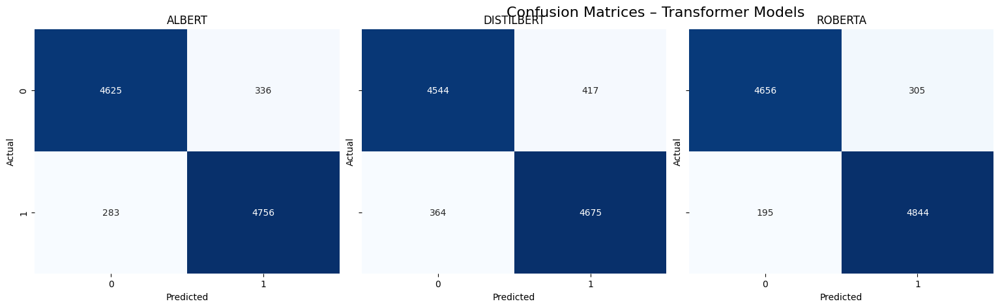

(<Figure size 2000x450 with 4 Axes>, <numpy.flatiter at 0x58b03980>)

In [ ]:
# Create one plotter per transformer model
plot_grid(
    transformer_cm_plotters, # Use the list generated by process_model_outputs
    n_cols=4,
    figsize_per_plot=(5.0, 4.5),        # tune if labels look cramped
    suptitle="Confusion Matrices – Transformer Models",
    sharex=True,
    sharey=True
)

## LLM Explainability with SHAP

To understand *why* the LLM makes specific predictions, we use SHAP (SHapley Additive exPlanations). SHAP assigns an importance value to each token (word) in a specific review, showing how much it pushed the model towards a "positive" or "negative" prediction.

In [ ]:
import shap
from transformers import pipeline
import torch

# Pick the first transformer model for SHAP explanation
model_name = model_names[0]
short_name = model_name.split("/")[-1].split("-")[0].upper()

model      = AutoModelForSequenceClassification.from_pretrained(model_name)
tokenizer  = get_tokenizer(model_name)

device = 0 if torch.cuda.is_available() else -1

pipe = pipeline(
    "text-classification",
    model=model,
    tokenizer=tokenizer,
    device=device,
    top_k=None
)

explainer = shap.Explainer(pipe)

sample_reviews = X_test_llm.iloc[:3].tolist()   # or .iloc[[10, 25, 47]] etc.

print(f"Calculating SHAP values for {short_name} ...")
shap_values = explainer(sample_reviews)

print(f"\nSHAP explanations for {short_name}:")
shap.plots.text(shap_values)

Loading weights:   0%|          | 0/25 [00:00<?, ?it/s]

AlbertForSequenceClassification LOAD REPORT from: albert/albert-base-v2
Key                          | Status     | 
-----------------------------+------------+-
predictions.decoder.bias     | UNEXPECTED | 
predictions.bias             | UNEXPECTED | 
predictions.dense.bias       | UNEXPECTED | 
predictions.LayerNorm.weight | UNEXPECTED | 
predictions.dense.weight     | UNEXPECTED | 
predictions.LayerNorm.bias   | UNEXPECTED | 
classifier.weight            | MISSING    | 
classifier.bias              | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Calculating SHAP values for ALBERT ...


You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  33%|███▎      | 1/3 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 100%|██████████| 3/3 [00:29<00:00,  8.60s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 4it [00:35, 11.76s/it]



SHAP explanations for ALBERT:


## Misclassification Analysis

To understand the failure modes of our models, we visualize the most frequent words found in **False Positives** (Negative reviews predicted as Positive) and **False Negatives** (Positive reviews predicted as Negative). This helps identify linguistic patterns that confuse the models (e.g., sarcasm, ambiguous words).

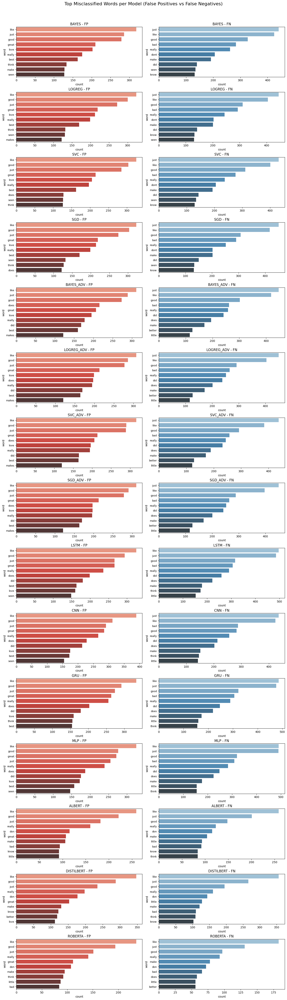

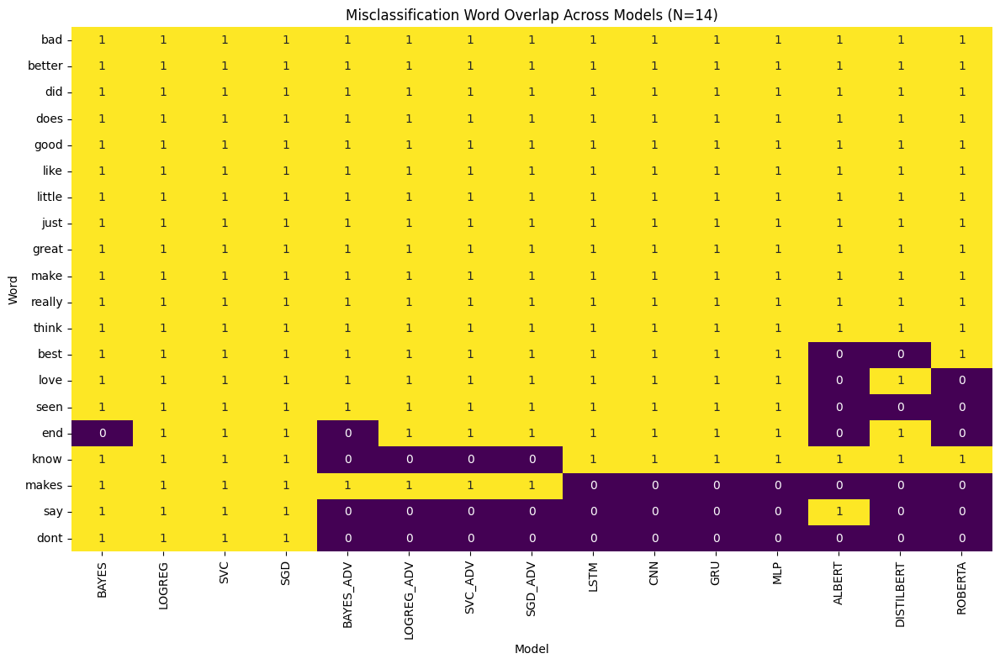

In [ ]:
# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
N_DISPLAY = 10     # top words shown in bar charts
N_OVERLAP = 14     # top words used for overlap analysis
all_misclass_words = defaultdict(lambda: {'fp_overlap': set(), 'fn_overlap': set()})

# ---------------------------------------------------------
# Helper: Extract top misclassification words
# ---------------------------------------------------------
def extract_top_words(texts, n_display=N_DISPLAY, n_overlap=N_OVERLAP):
    """
    Returns:
        display_df: DataFrame of top n_display words (for plotting)
        overlap_set: set of top n_overlap words (for overlap analysis)
    """
    if len(texts) == 0:
        return pd.DataFrame(columns=['word', 'count']), set()

    vec = CountVectorizer(stop_words='english', max_features=n_overlap * 2)

    try:
        bow = vec.fit_transform(texts)
        sum_words = bow.sum(axis=0)

        words_freq = [(word, sum_words[0, idx])
                      for word, idx in vec.vocabulary_.items()]

        # Remove domain-neutral words
        words_freq = [(w, c) for w, c in words_freq if w not in WORDS_TO_REMOVE]

        # Sort by frequency
        words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)

        # Build outputs
        display_df = pd.DataFrame(words_freq[:n_display],
                                  columns=['word', 'count'])
        overlap_set = set([w for w, _ in words_freq[:n_overlap]])

        return display_df, overlap_set

    except ValueError:
        return pd.DataFrame(columns=['word', 'count']), set()



# ── Decide grid size ──
n_models = len(traditional_outputs) + len(transformer_outputs) + len(nn_outputs)
n_cols = 2          # always FP | FN
n_rows = n_models   # one row per model

fig, axes = plt.subplots(
    nrows=n_rows,
    ncols=n_cols,
    figsize=(14, 3.2 * n_rows),          # height grows with number of models
    sharex=False,
    sharey=False,
    constrained_layout=True
)

# Flatten for easier indexing: axes[row, col]
# If only one row it would be 1D, so we make sure it's 2D
if n_rows == 1:
    axes = axes.reshape(1, -1)

row_idx = 0

# ── Transformer/Neural network models ──
for model_info in traditional_outputs + nn_outputs + transformer_outputs:
    name = model_info['name'].upper()

    # For transformer/NN models, y_true and y_pred are already 0/1 integers or numpy arrays
    y_true_bin = pd.Series(model_info['y_true']).astype(int)
    y_pred_bin = pd.Series(model_info['y_pred']).astype(int)

    X_reset = model_info['X_test_text'].reset_index(drop=True)

    fp_mask = (y_true_bin == 0) & (y_pred_bin == 1)
    fn_mask = (y_true_bin == 1) & (y_pred_bin == 0)

    fp_texts = X_reset[fp_mask]
    fn_texts = X_reset[fn_mask]

    fp_display, fp_overlap_set = extract_top_words(fp_texts)
    fn_display, fn_overlap_set = extract_top_words(fn_texts)

    # Store overlap sets
    all_misclass_words[name]['fp_overlap'] = fp_overlap_set
    all_misclass_words[name]['fn_overlap'] = fn_overlap_set

    if not fp_display.empty:
        sns.barplot(x='count', y='word', data=fp_display, ax=axes[row_idx, 0], palette='Reds_d', hue='word', legend=False)
    axes[row_idx, 0].set_title(f'{name} - FP')

    if not fn_display.empty:
        sns.barplot(x='count', y='word', data=fn_display, ax=axes[row_idx, 1], palette='Blues_d', hue='word', legend=False)
    axes[row_idx, 1].set_title(f'{name} - FN')

    row_idx += 1

# Final touches
fig.suptitle("Top Misclassified Words per Model (False Positives vs False Negatives)",
             fontsize=16, y=1.02)

# Optional: make y-labels smaller / rotate if words are long
for ax in axes.flat:
    ax.tick_params(axis='y', labelsize=9)
    # ax.set_yticklabels(ax.get_yticklabels(), rotation=0, ha='right')  # if needed

plt.show()


# ---------------------------------------------------------
# Overlap heatmap
# ---------------------------------------------------------
def plot_overlap_heatmap(all_misclass_words, top_words):
    models = list(all_misclass_words.keys())
    words = list(top_words)

    matrix = []
    for word in words:
        row = []
        for model in models:
            present = int(
                (word in all_misclass_words[model]['fp_overlap']) or
                (word in all_misclass_words[model]['fn_overlap'])
            )
            row.append(present)
        matrix.append(row)

    df = pd.DataFrame(matrix, index=words, columns=models)

    plt.figure(figsize=(12, 8))
    sns.heatmap(df, annot=True, cmap="viridis", cbar=False)
    plt.title(f"Misclassification Word Overlap Across Models (N={N_OVERLAP})")
    plt.xlabel("Model")
    plt.ylabel("Word")
    plt.tight_layout()
    plt.show()


# ---------------------------------------------------------
# Build overlap table
# ---------------------------------------------------------
records = []
for model, cats in all_misclass_words.items():
    for w in cats['fp_overlap']:
        records.append({'word': w, 'model': model, 'type': 'FP'})
    for w in cats['fn_overlap']:
        records.append({'word': w, 'model': model, 'type': 'FN'})

if records:
    df = pd.DataFrame(records)

    overlap = df.groupby('word').agg(
        num_models=('model', 'nunique'),
        appears_in=('model', lambda x: ', '.join(sorted(x.unique())))
    ).reset_index()

    overlap = overlap.sort_values('num_models', ascending=False).head(20)
    top_words = overlap['word'].tolist()

    plot_overlap_heatmap(all_misclass_words, top_words)
else:
    print("No misclassification words collected.")


## Plotting the Aggregate model metrics

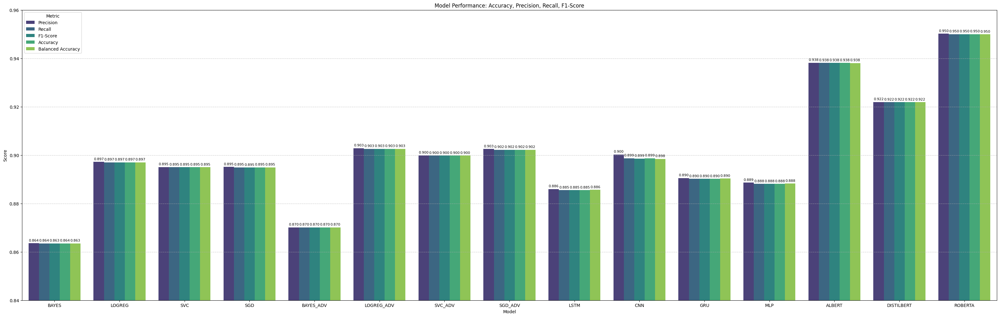

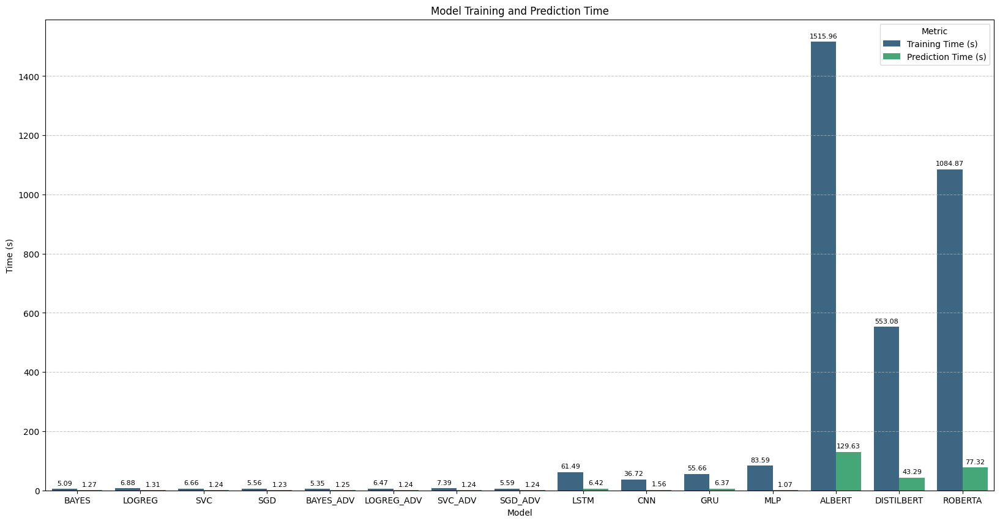

In [ ]:
all_metrics_df = pd.concat([trad_metrics_df, nn_metrics_df, transformer_metrics_df], ignore_index=True)
all_time_df = pd.concat([trad_time_df, nn_time_df, transformer_time_df], ignore_index=True)


plot_model_metrics(
    all_metrics_df,
    title="Model Performance: Accuracy, Precision, Recall, F1-Score",
    ylim=(0.84, 0.96),
    figsize=(40, 12),
    fmt="%.3f"
)

plot_model_metrics(
    all_time_df,
    title="Model Training and Prediction Time",
    y_label="Time (s)",
    fmt="%.2f"
)

# Summary

### **Core Insight**

Across all models, misclassifications are driven by **contextual ambiguity**, not by sentiment words themselves. Once domain words like "movie/film" are removed, the remaining vocabulary reveals that errors arise from:

- **negation scope failures** ("dont")
- **contrastive structures** ("good but...", "bad at first but...")
- **hedged sentiment** ("just good enough")
- **mixed or multi-aspect reviews**
- **sarcasm or rhetorical phrasing**

This is exactly where bag-of-words models struggle, and may require more vigorous fine-tuning or a larger LLM to increase its accuracy. **Since we are not given a neutral category**, there is no method to categorize such ambiguous
reviews.

---
## Neural Network Performance vs. Traditional ML Models
The neural networks remains the poor performer across all evaluation metrics, given its cost. Other than Naive Bayes, Traditional ML models delivers consistently higher Precision, Recall, F1-Score, Accuracy, and Balanced Accuracy.

## LLM Performance vs. Traditional ML Models  
The fine-tuned LLM remains the top performer across all evaluation metrics. While the margin over the best classical model (Logistic Regression and Linear SVC) is modest: up to **1.5% for DistilBERT** and up to **5% for RoBERTa**. The LLM delivers consistently higher Precision, Recall, F1-Score, Accuracy, and Balanced Accuracy.

### Key Performance Findings  
- The LLMs achieved over **91%** across all major metrics (Accuracy, Precision, Recall, F1-Score, Balanced Accuracy).  
- Logistic Regression, SGD, and Linear SVC, the strongest traditional models, neared **90%**, remained head-to-head but trailing behind DistilBERT by up to **1.5%**.  

-  Naive-Bayes performed the worst of all of the models.

- Neural Networks perform better than Naive-Bayes, but underperform vs other models.


## Training & Prediction Time Analysis  
This is where the models diverge sharply. The LLM's performance advantage comes with **substantial computational cost**.

### Interpretation  
- **Training Time:**  

  The LLMs are the slowest of all models, taking at least 5 minutes for 1 epoch using a Nvidia Tesla T4, and increases as model size grows. From other Notebooks without GPU acceleration, this may take several hours of training time, depending on the CPU hardware. Needing less than 30 seconds of training time, traditional ML models are clearly superior for efficiency and speed.
- **Prediction Time:**  

  The LLM is also slower at inference, over **30-50x slower** than traditional ML models.
- **Hardware requirements:**

  Traditional ML models from `scikit-learn` run efficiently on standard CPUs and do not require GPU acceleration. In contrast, fine-tuning and running an LLM generally benefits significantly from GPU hardware (e.g., NVIDIA GPUs) to achieve reasonable training and inference times. Without GPU support, LLM training becomes impractically slow, and even inference can be substantially delayed.
---

## Is the Trade-Off Worth It?  

### When the LLMs *are* worth it  
- When **accuracy is the top priority**, and even a 1.5-5% improvement has meaningful business value. For example, RoBERTa has at least 94% accuracy, indicating that it will only miss 3 of every 50 reviews, compared to 1 of every 10 for other models.

- When the system processes **moderate volumes** of text where latency is acceptable.  
- When interpretability is less important than raw performance.  
- When the model may later be extended to **more complex tasks** (e.g., multi-label classification, summarization, reasoning).
- When the organization expects to **scale up model capacity** over time, since LLMs benefit from increasing parameter counts: larger models generally exhibit smoother generalization, stronger contextual reasoning, and better robustness to edge cases, allowing performance to continue improving as compute budgets grow. This can be seen as RoBERTA, a 0.1B parameter model, have better performance vs DistilBERT, a 67M parameter model.

### When traditional ML models may be preferable  
- When **speed and cost** matter more than squeezing out the last bit of accuracy.  
- When the system needs to handle **high-throughput, real-time inference**.  
- When training must be repeated frequently (e.g., continuous retraining).  
- When the performance gap (~1-5%) does **not** justify a **5x to 50x increase** in compute time or additional hardware costs.
- When the current accuracy metrics is acceptable, and since traditional ML models do not benefit from parameter scaling the way LLMs do, it becomes cost-efficient for stable and larger workloads.

---
### Bottom Line and Business Implications
The LLMs deliver the best performance, but at a **significant computational cost**. For many production environments, Logistic Regression, SGD, Linear SVC may offer a more practical balance of speed, simplicity, and accuracy. The LLMs become the right choice when maximizing predictive performance is mission-critical and the additional compute cost is acceptable. Results show that for all models, **misclassifications are driven not by specific sentiment words but by contextual ambiguity** which consistently confuse every model regardless of architecture.


However, when evaluating sentiment at scale for a single movie, all models, regardless of complexity, produce reliably consistent results. While their individual predictions may vary at the review level, the aggregate sentiment ratios (positive vs. negative) remain highly accurate (> 80%) across models. This means that for high-level business decisions, such as gauging overall audience reception, even lightweight traditional models provide sufficiently accurate and actionable insights.